# Análisis de Quiebra de Compañías

Las compañias entran en lo que se denomina estado de cesación de pagos (corresponde al término anglosajón default), cuando los activos con los que cuentan no son suficientes a efectos de afrontas sus pasivos (o sus deudas). Este dataset toma regitros para el Economic Journal de Taiwan referente a los años 1999 a 2009. El concepto de una empresa en bancarota (estado de cesación de pagos) para definir la variable target es el que corresponde a las leyes de Taiwan.

El objetivo del presente es determinar -en base a los datos recopilados- la posibilidad de que una empresa caiga en estado de cesación de pagos, en base a diversas variables microeconomicas que hacen a los distintos atributos del dataset. Este tipo de análisis resulta interesante para directivos de cualquier clase de empresa, como también para posibles inversores o fondos interesados en reestructurar compañías en estados cercanos a la quiebra, para luego revender las acciones de las mismas.

## EDA

In [1]:
# Importamos las librerias

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.metrics import f1_score
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [2]:
# Seteamos el estilo para mpl y sns

sns.set(style="ticks", context="talk")
plt.style.use("dark_background")

In [3]:
# Importamos el dataset con read_csv

df = pd.read_csv('data.csv')
df

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009


In [4]:
# Revisamos la cantidad de filas y columnas

df.shape

(6819, 96)

Como se puede observar, el dataset cuenta con 6.819 registros y 95 atributos (descontando la variable target). Debido a la gran cantidad de atributos, en ocasiones simplificaremos el análisis centrandonos sólo en elgunos de éstos, permitiendo así también una mejor visualización de los gráficos.

In [5]:
# Revisamos información básica del dataset, tal como el tipo de datos y los datos nulos

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

Como podemos apreciar, los atributos se tratan casi en su mayoría de variables númericas, salvo dos de ellas (además de la variable target) que parecen ser categóricas.

In [6]:
# Chequeamos la cantidad de datos nulos que hay por cada columna

df.isnull().sum().sort_values()

Bankrupt?                                 0
 Total income/Total expense               0
 Retained Earnings to Total Assets        0
 Long-term Liability to Current Assets    0
 Current Liabilities/Equity               0
                                         ..
 Regular Net Profit Growth Rate           0
 After-tax Net Profit Growth Rate         0
 Operating Profit Growth Rate             0
 Net Income Flag                          0
 Equity to Liability                      0
Length: 96, dtype: int64

Como se puede apreciar, no existen datos nulos en el dataset, lo que facilitará nuestro análisis.

In [7]:
# Revisamos algunas medidas estadísticas estándar para el dataset

df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


In [8]:
# Realizamos un pivot de lo anterior para facilitar su visualización

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,6819.0,0.032263,0.176710,0.0,0.000000,0.000000,0.000000,1.0
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
Operating Gross Margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
...,...,...,...,...,...,...,...,...
Liability to Equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of Financial Leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest Coverage Ratio (Interest expense to EBIT),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0
Net Income Flag,6819.0,1.000000,0.000000,1.0,1.000000,1.000000,1.000000,1.0


In [9]:
# Reemplazamos el nombre de la columna de la variable target

df.rename(columns={'Bankrupt?':'target'}, inplace=True)

In [10]:
# Hacemos un conteo de la variable target

df['target'].value_counts()

0    6599
1     220
Name: target, dtype: int64

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='target', ylabel='count'>

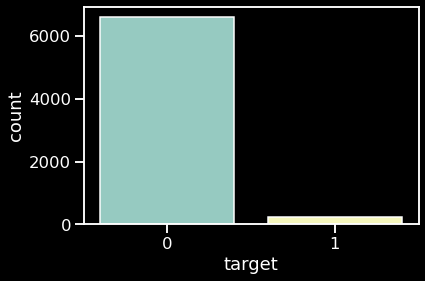

In [11]:
# Hacemos un gráfico para mostrar el conteo de la variable target

sns.countplot('target',data=df)

In [12]:
# Tomamos algunas medidas estadísticas estándar de la variable target

df['target'].describe()

count    6819.000000
mean        0.032263
std         0.176710
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: target, dtype: float64

Como se puede observar existe un gran desbalance respecto de los registros para la variable target. Solo 220 registros corresponden a empresas en quiebra frente a 6.599 correspondientes a empresas que no se encuentran en quiebra.

Deberemos tomar esta cuestión en consideración a la hora de entrenar nuestros modelos y aplicar alguna técnica para balancear el dataset.

In [13]:
# Dividimos las variables númericas de las categóricas

numeric_features = df.dtypes[df.dtypes != 'int64'].index
categorical_features = df.dtypes[df.dtypes == 'int64'].index


# Chequeamos cuáles son las variables categóricas

df[categorical_features].columns.tolist()

['target', ' Liability-Assets Flag', ' Net Income Flag']

Vemos que, además de la variable target, existen dos variables categóricas:
* Liability-Assets Flag hace referencia a los casos en que el pasivo de la empresa es mayor a los activos de la empresa.
* Net Income Flag hace referencia a los casos en que el ingreso neto de la compañía es negativo para los últimos años.

In [14]:
# Hacemos un conteo de la bandera correspondiente a que los pasivos son mayores que los activos

df[' Liability-Assets Flag'].value_counts()

0    6811
1       8
Name:  Liability-Assets Flag, dtype: int64

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel=' Liability-Assets Flag', ylabel='count'>

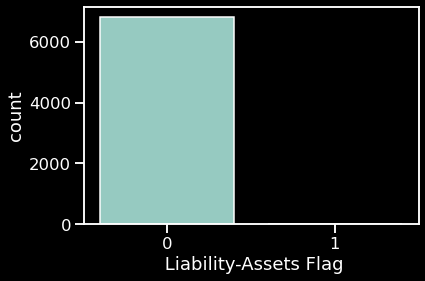

In [15]:
# Hacemos un gráfico para mostrar el conteo de la bandera correspondiente a que los pasivos son mayores que los activos

sns.countplot(' Liability-Assets Flag', data=df)

Como se puede observar, la mayor parte de las veces, los activos son mayores que los pasivos de la empresa en el dataset

In [16]:
# Hacemos un conteo de la bandera correspondiente a que el ingreso neto de la compañía es negativo

df[' Net Income Flag'].value_counts()

1    6819
Name:  Net Income Flag, dtype: int64

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel=' Net Income Flag', ylabel='count'>

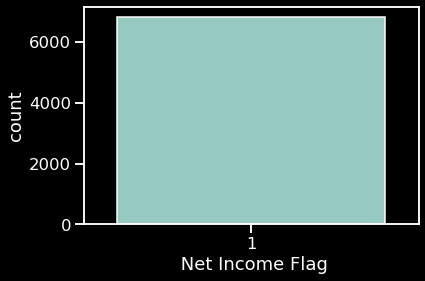

In [17]:
# Hacemos un gráfico para mostrar el conteo de la bandera correspondiente a que el ingreso neto de la compañía es negativo

sns.countplot(' Net Income Flag', data=df)

Como se puede observar, todo los registros corresponden a empresas con ingresos netos negativos para los últimos años.

 Liability-Assets Flag  target
0                       0         6597
                        1          214
1                       1            6
                        0            2
dtype: int64


<AxesSubplot:xlabel=' Liability-Assets Flag', ylabel='count'>

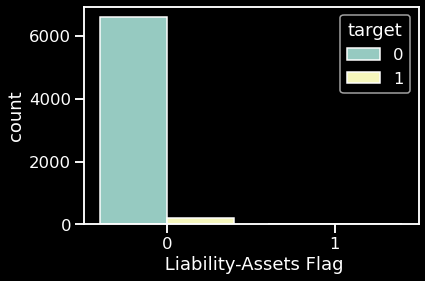

In [18]:
# Hacemos un conteo de la bandera correspondiente a que los pasivos de la empresa son mayores a los activos,
# contra la variable target

print(df[[' Liability-Assets Flag','target']].value_counts())
sns.countplot(x = ' Liability-Assets Flag',hue = 'target',data=df)

Como se puede observar, cuando los pasivos son mayores que los activos, es más probable que la empresa caiga en estado de cesación de pagos.

 Net Income Flag  target
1                 0         6599
                  1          220
dtype: int64


<AxesSubplot:xlabel=' Net Income Flag', ylabel='count'>

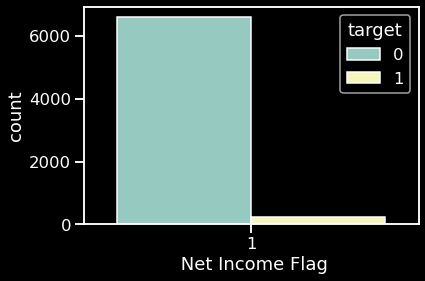

In [19]:
# Hacemos un conteo de la bandera correspondiente a ingresos netos negativos, contra la variable target

print(df[[' Net Income Flag','target']].value_counts())
sns.countplot(x = ' Net Income Flag',hue = 'target',data=df)

En este caso el análisis no es muy revelador, ya que la totalidad de los registros corresponden con empresas con ingresos netos negativos para los últimos años.

In [20]:
# Debido a la gran cantidad de variables númericas que existen en el dataset,
# realizamos un resumen del mismo, tomando aquellas que tienen una mayor correlación positiva y negativa con la variable target

positive_corr = df[numeric_features].corrwith(df['target']).sort_values(ascending=False)[:6].index.tolist()
negative_corr = df[numeric_features].corrwith(df['target']).sort_values()[:6].index.tolist()
target_var = df['target']

df_summary_positive = df[positive_corr +['target']].copy()
df_summary_negative = df[negative_corr +['target']].copy()
df_summary = df[positive_corr + negative_corr +['target']].copy()

df_summary.head()

,Debt ratio %,Current Liability to Assets,Borrowing dependency,Current Liability to Current Assets,Liability to Equity,Current Liabilities/Equity,Net Income to Total Assets,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,ROA(C) before interest and depreciation before interest,Net worth/Assets,Persistent EPS in the Last Four Seasons,target
0,0.207576,0.147308,0.390284,0.118250,0.290202,0.339077,0.716845,0.424389,0.405750,0.370594,0.792424,0.169141,1
1,0.171176,0.056963,0.376760,0.047775,0.283846,0.329740,0.795297,0.538214,0.516730,0.464291,0.828824,0.208944,1
2,0.207516,0.098162,0.379093,0.025346,0.290189,0.334777,0.774670,0.499019,0.472295,0.426071,0.792484,0.180581,1
3,0.151465,0.098715,0.379743,0.067250,0.281721,0.331509,0.739555,0.451265,0.457733,0.399844,0.848535,0.193722,1
4,0.106509,0.110195,0.375025,0.047725,0.278514,0.330726,0.795016,0.538432,0.522298,0.465022,0.893491,0.212537,1


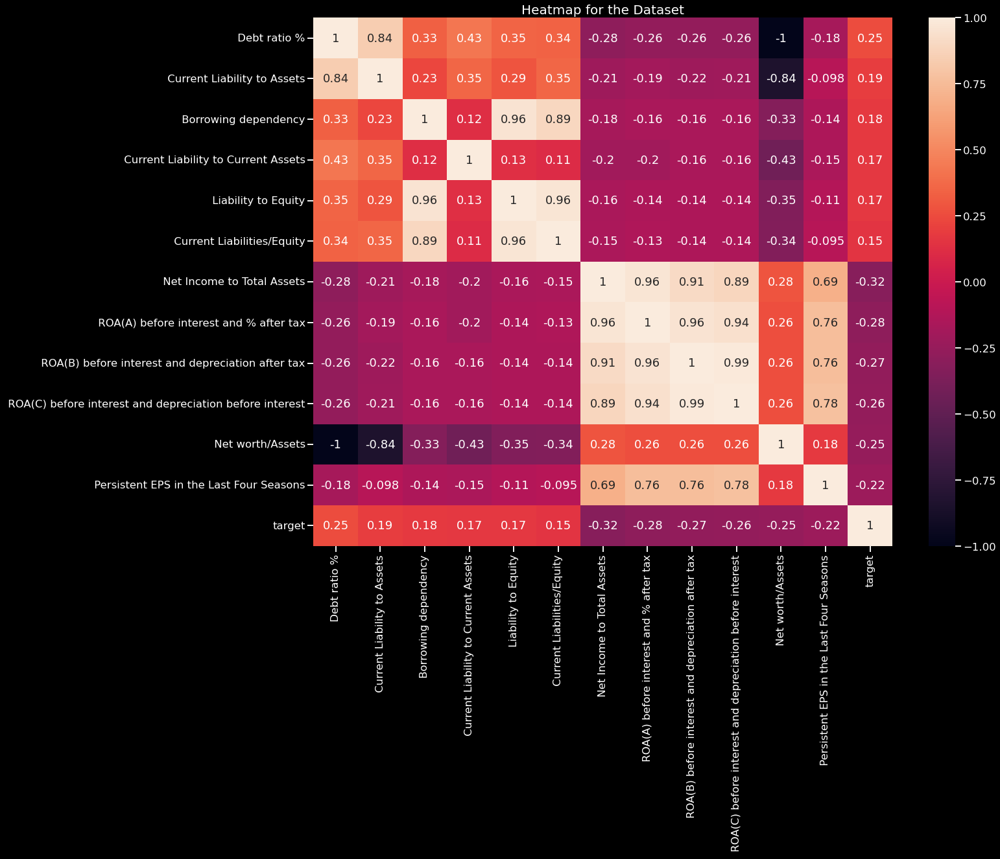

In [21]:
# Hacemos un heatmap para las variables con mayor correlación positiva y negativa con la variable target

plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(df_summary.corr(), annot = True)
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

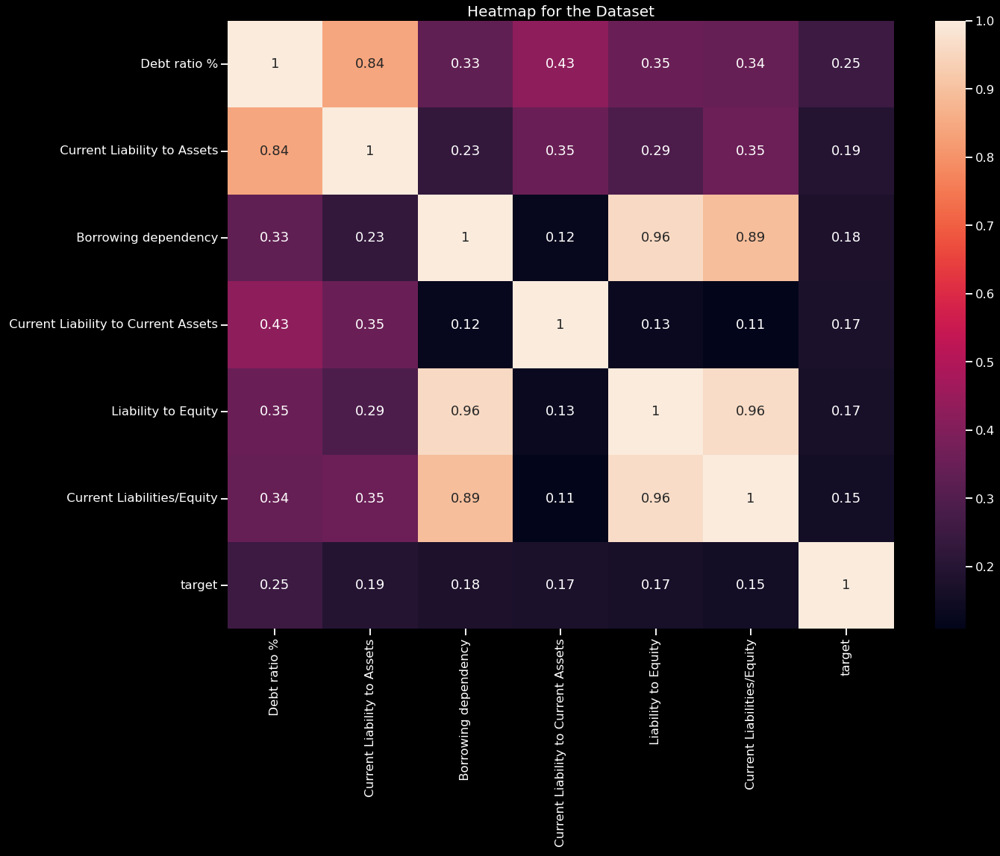

In [22]:
# Hacemos un heatmap para las variables con mayor correlación positiva con la variable target

plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(df_summary_positive.corr(), annot = True)
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

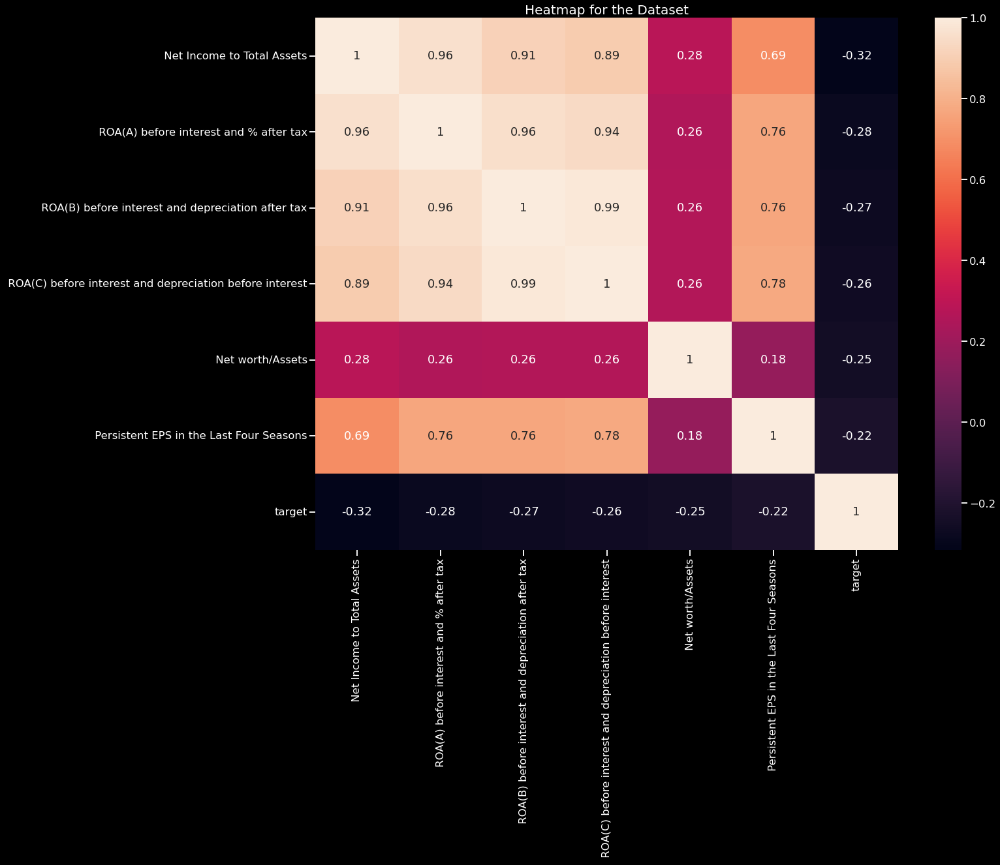

In [23]:
# Hacemos un heatmap para las variables con mayor correlación negativa con la variable target

plt.rcParams['figure.figsize'] = (20, 15)

sns.heatmap(df_summary_negative.corr(), annot = True)
plt.title('Heatmap for the Dataset', fontsize = 20)
plt.show()

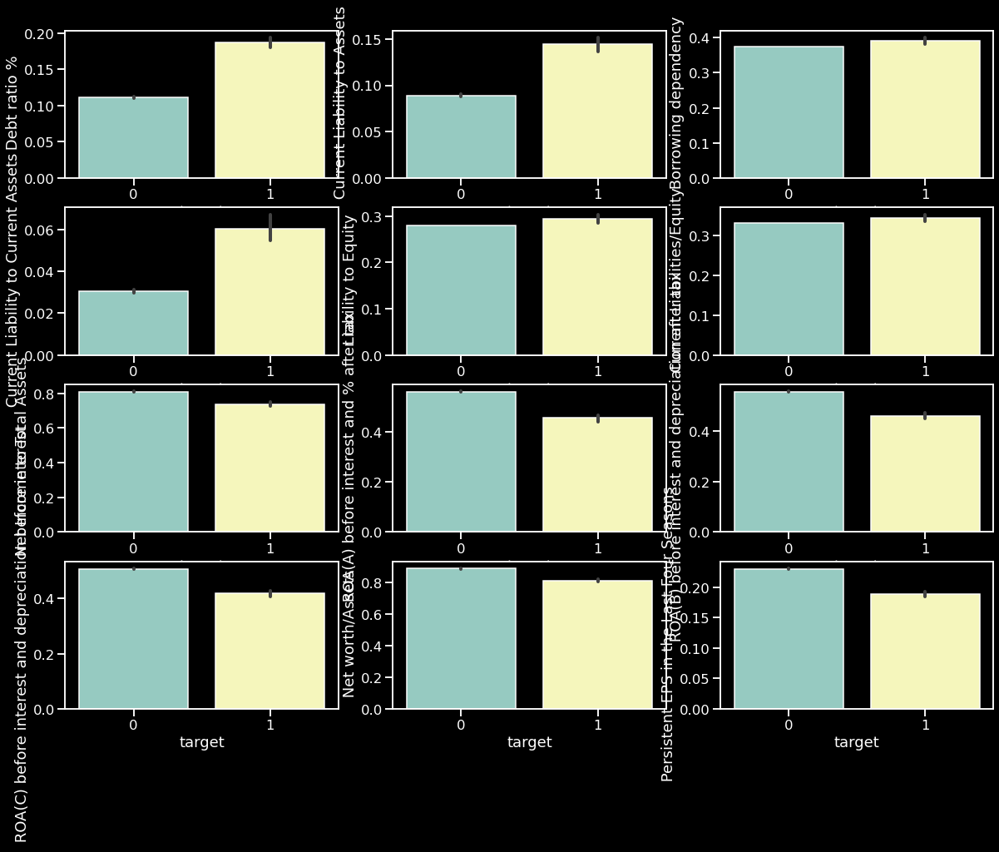

In [24]:
# Realizamos gráficos de barras para mostrar la correlación de las variables con mayor correlación con la variable target

y_values = df_summary.columns.tolist()[:-1]

def corrbargraph(x_value, y_value):

    for i in range(1,13):
        plt.subplot(4,3,i)
        sns.barplot(x=x_value, y=y_value[i-1],data = df)

corrbargraph(df_summary['target'], y_values)

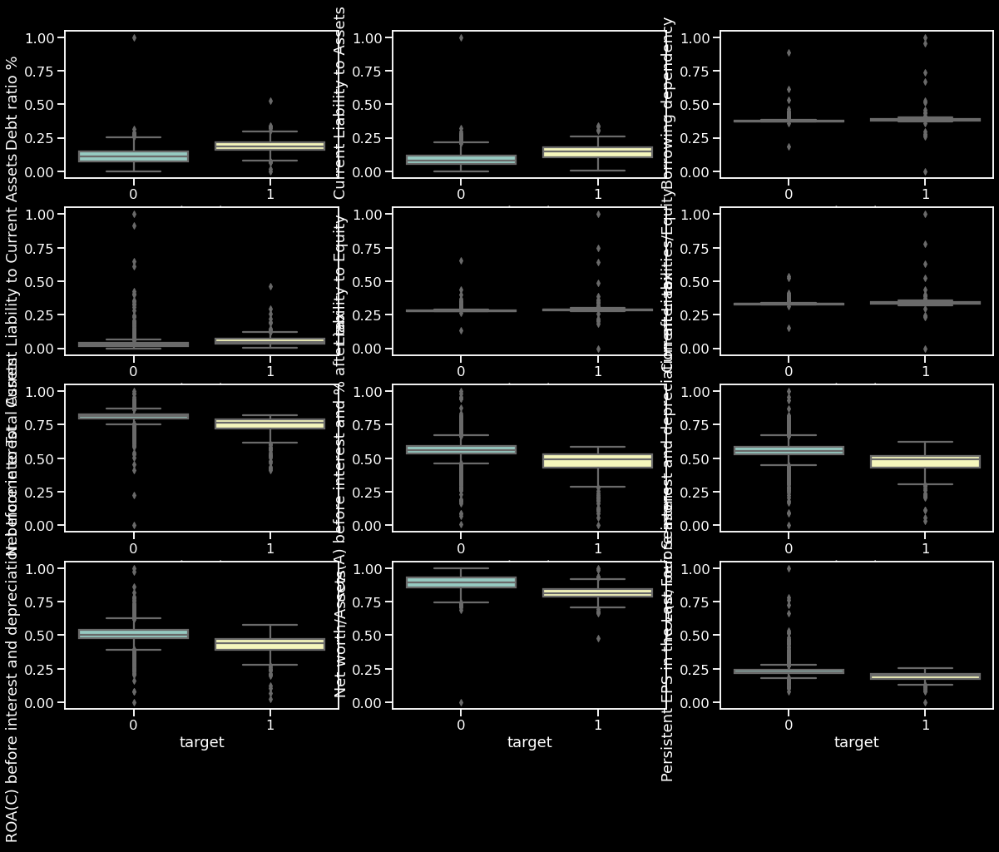

In [25]:
# Realizamos boxplots para mostrar la correlación de las variables con mayor correlación con la variable target

def corrboxplot(x_value, y_value):

    for i in range(1,13):
        plt.subplot(4,3,i)
        sns.boxplot(x=x_value, y=y_value[i-1],data = df)

corrboxplot(df_summary['target'], y_values)

<Figure size 2400x1800 with 0 Axes>

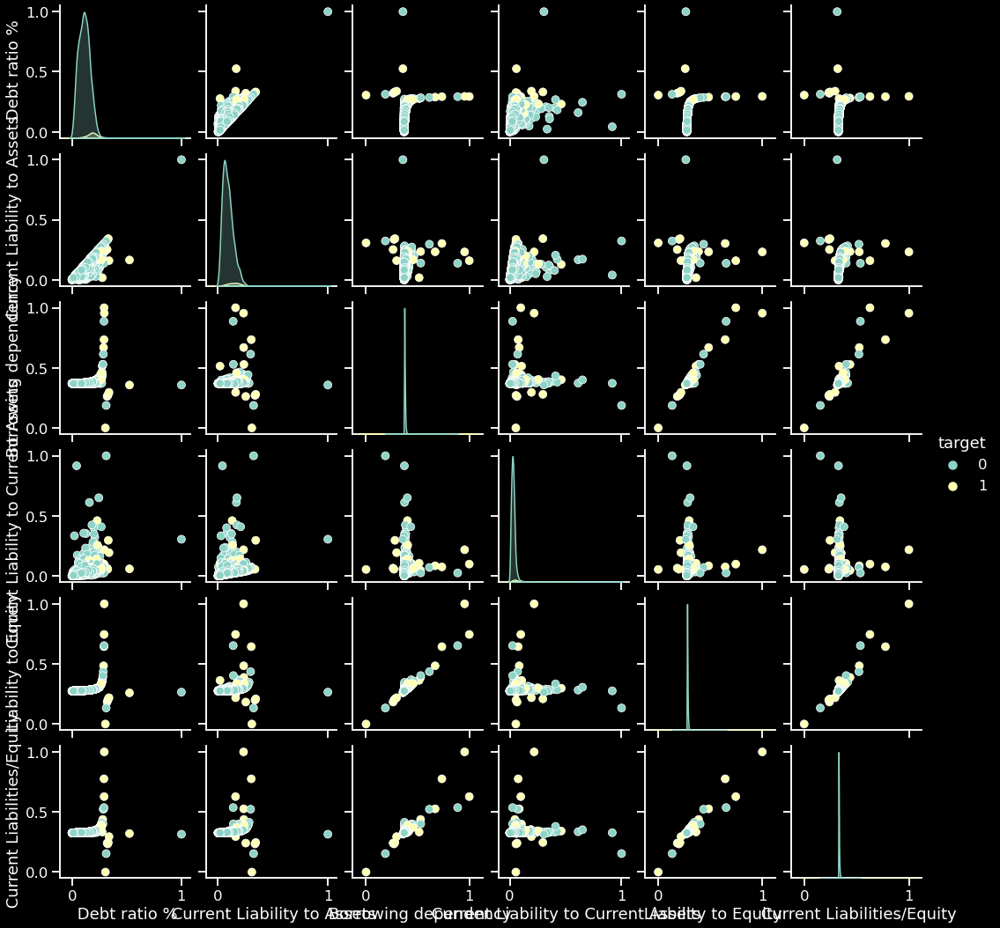

In [26]:
# Realizamos un pairplot para las variables con mayor correlación positiva

plt.figure(dpi = 120)
sns.pairplot(df_summary_positive,hue='target')
plt.show()

<Figure size 2400x1800 with 0 Axes>

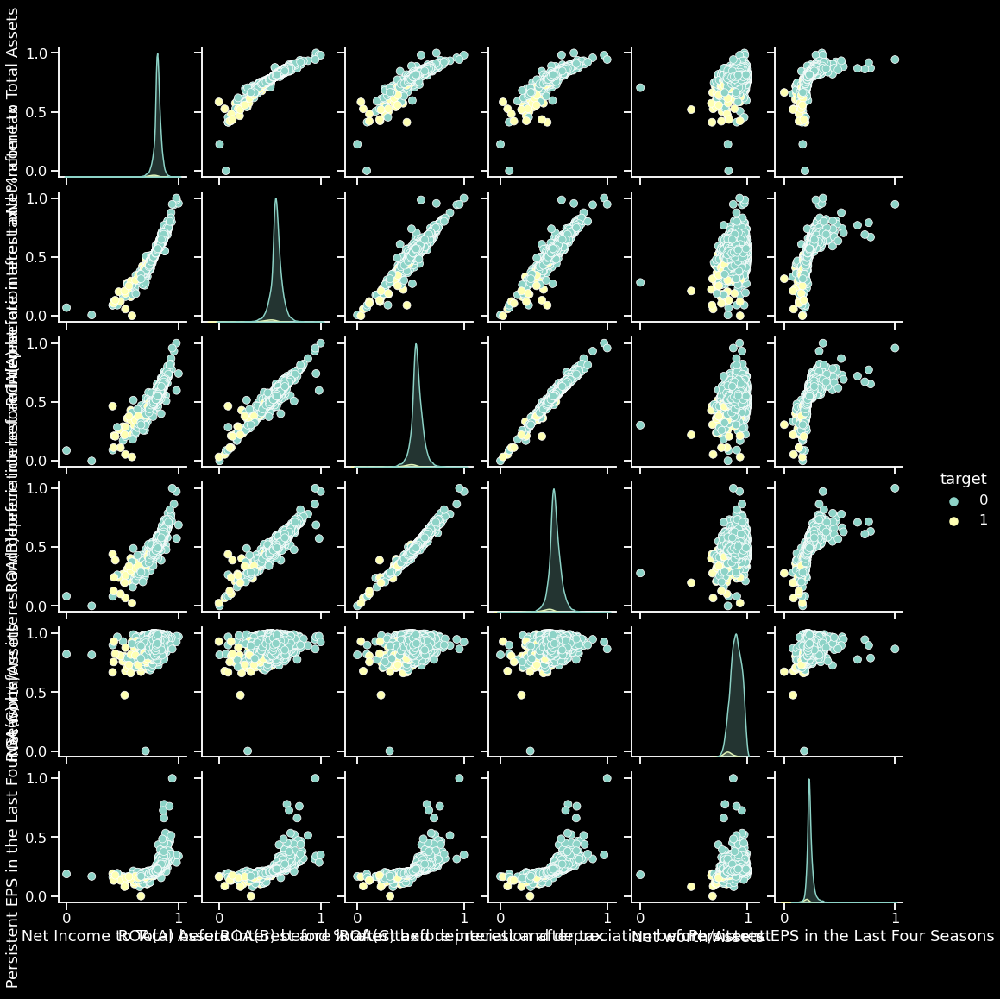

In [27]:
# Realizamos un pairplot para las variables con mayor correlación negativa

plt.figure(dpi = 120)
sns.pairplot(df_summary_negative,hue='target')
plt.show()

Joint plot de Target con otras variables
Correlacion entre Target y  Debt ratio % 0.2501609620666178


<Figure size 500x400 with 0 Axes>

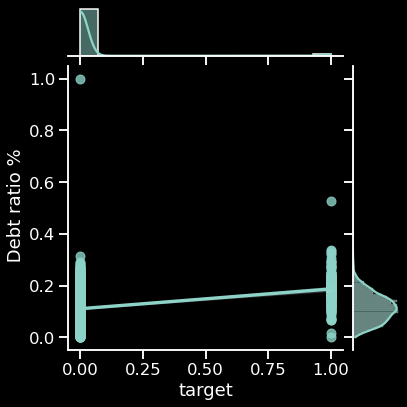

Correlacion entre Target y  Current Liability to Assets 0.19449443585543952


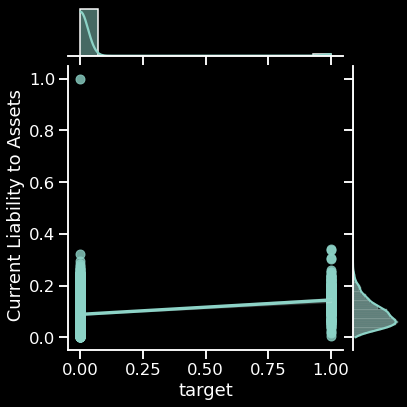

Correlacion entre Target y  Borrowing dependency 0.17654293616159944


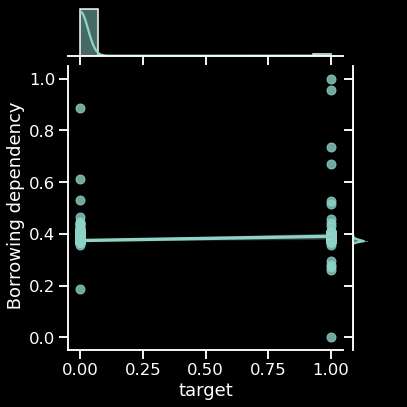

Correlacion entre Target y  Current Liability to Current Assets 0.17130604352180526


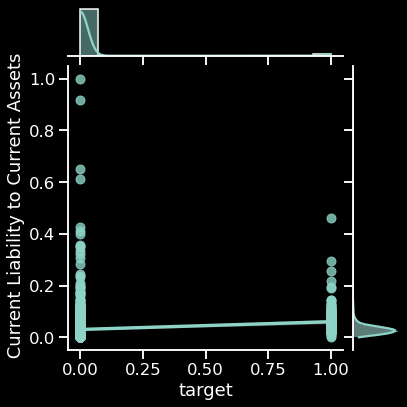

Correlacion entre Target y  Liability to Equity 0.166812097781114


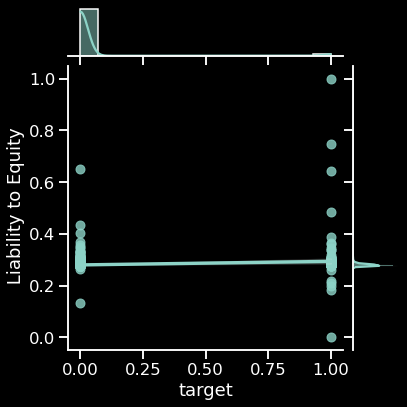

Correlacion entre Target y  Current Liabilities/Equity 0.15382836190696916


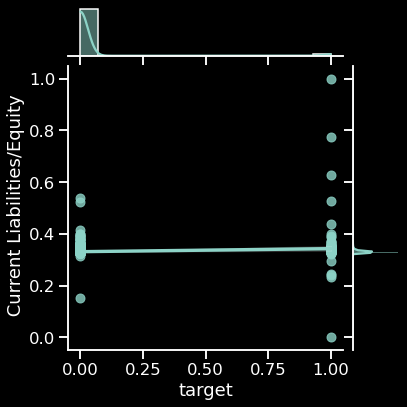

Correlacion entre Target y  Net Income to Total Assets -0.31545697161429925


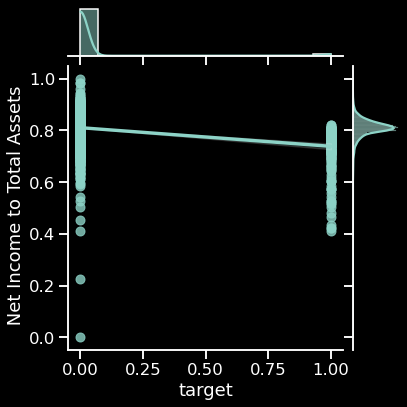

Correlacion entre Target y  ROA(A) before interest and % after tax -0.28294058493448865


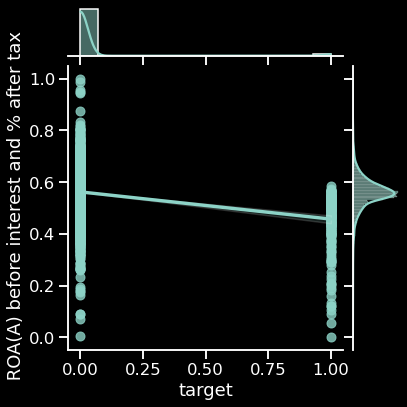

Correlacion entre Target y  ROA(B) before interest and depreciation after tax -0.27305131786329306


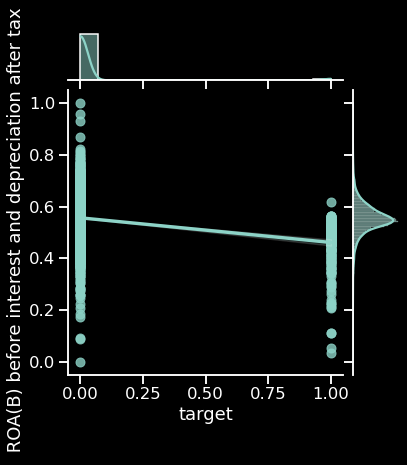

Correlacion entre Target y  ROA(C) before interest and depreciation before interest -0.2608065575202611


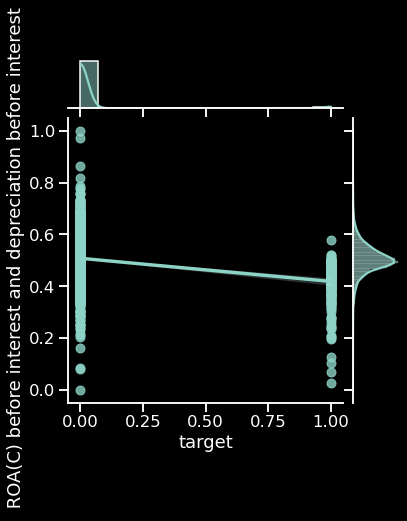

Correlacion entre Target y  Net worth/Assets -0.2501609620666194


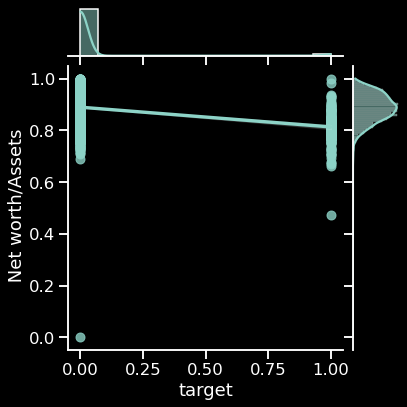

Correlacion entre Target y  Persistent EPS in the Last Four Seasons -0.21955968119078761


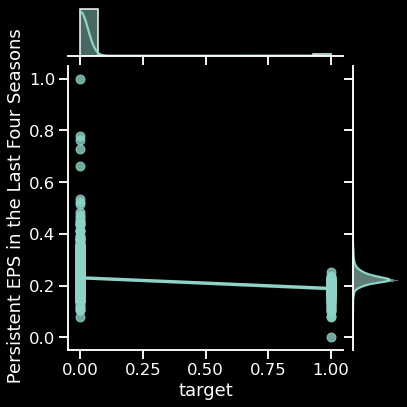

In [28]:
# Recorremos el pairplot para cada una de las variables con mayor correlación positiva y negativa
# con la variable target en detalle

plt.figure(dpi = 100, figsize = (5,4))
print('Joint plot de Target con otras variables')
for i in df_summary.columns:
    if i != 'target':
        print(f'Correlacion entre Target y {i}',df_summary.corr().loc['target'][i])
        sns.jointplot(x='target',y=i,data=df_summary,kind = 'reg')
        plt.show()

Como se puede observar, existe una mayor posibilidad de que la empresa se encuentre en estado de cesación de pagos en los casos en donde su ratio de deuda es alto, sus pasivos corrientes son mayores a sus activos totales (y sus activos corrientes), tiene mayores pasivos totales (y pasivos correientes) que equity, y cuando su dependecia a los préstamos es alta.

Por otro lado, es menos problable que una empresa caiga en la quiebra cuando sus ingresos netos son mayores a sus activos, su rentabilidad economica (return on assets) es mayor a sus activos y es alto, su valor neto es mayor que sus activos y tiene un beneficio por acción alto para los ultimos años de forma persistente.

In [29]:
# Realizamos un profiling del dataset (también se acompaña el HTML por separado para una mejor visualización)

from pandas_profiling import ProfileReport
profile = ProfileReport(df_summary, title="Pandas Profiling Report", minimal=False, orange_mode=True)
profile

Render HTML: 100%|██████████| 1/1 [00:12<00:00, 12.18s/it]


## Preprocesamiento

In [30]:
# Divididmos el dataset para diferenciar la variable target

x = df.drop('target', axis=1)
y = df['target']

In [31]:
# Separameos los datos en training y testing en un 70% y 30%

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.30, random_state = 42)

In [32]:
# Pasamos los datos por un standard scaler
# Dado que las variables tienen distintas magnitudes, es una buena practica escalar los datos,
# para evitar que esto imapacte en los modelos

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(x_train)
x_train = pd.DataFrame(scaler.transform(x_train), index=x_train.index, columns=x_train.columns)
x_test = pd.DataFrame(scaler.transform(x_test), index=x_test.index, columns=x_test.columns)

## Modelos

### Arbol de Decision

In [33]:
# Entrenamos un modelo de arbol de desicion

from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
dt.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)

In [34]:
# Predicciones en train y test

dt_y_train_pred = dt.predict(x_train)
dt_y_test_pred = dt.predict(x_test)

In [35]:
# Chequeamos el f1 del modelo

dt_train_f1 = f1_score(y_train, dt_y_train_pred, average='weighted')

dt_test_f1 = f1_score(y_test, dt_y_test_pred, average='weighted')

print('Train F-1: ', dt_train_f1)
print('Test F-1: ', dt_test_f1)

Train F-1:  0.9555985956379653
Test F-1:  0.943185653731003


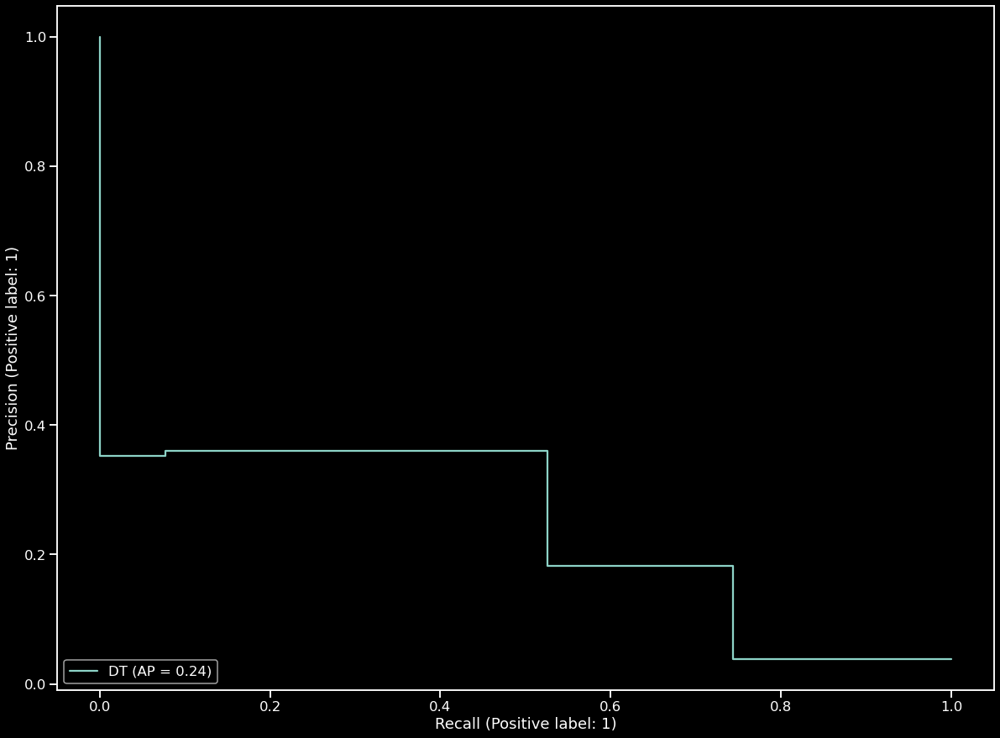

In [36]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(dt, x_test, y_test, name='DT')


              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1968
           1       0.00      0.00      0.00        78

    accuracy                           0.96      2046
   macro avg       0.48      0.50      0.49      2046
weighted avg       0.93      0.96      0.94      2046

[[1968    0]
 [  78    0]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jvegasainz/an

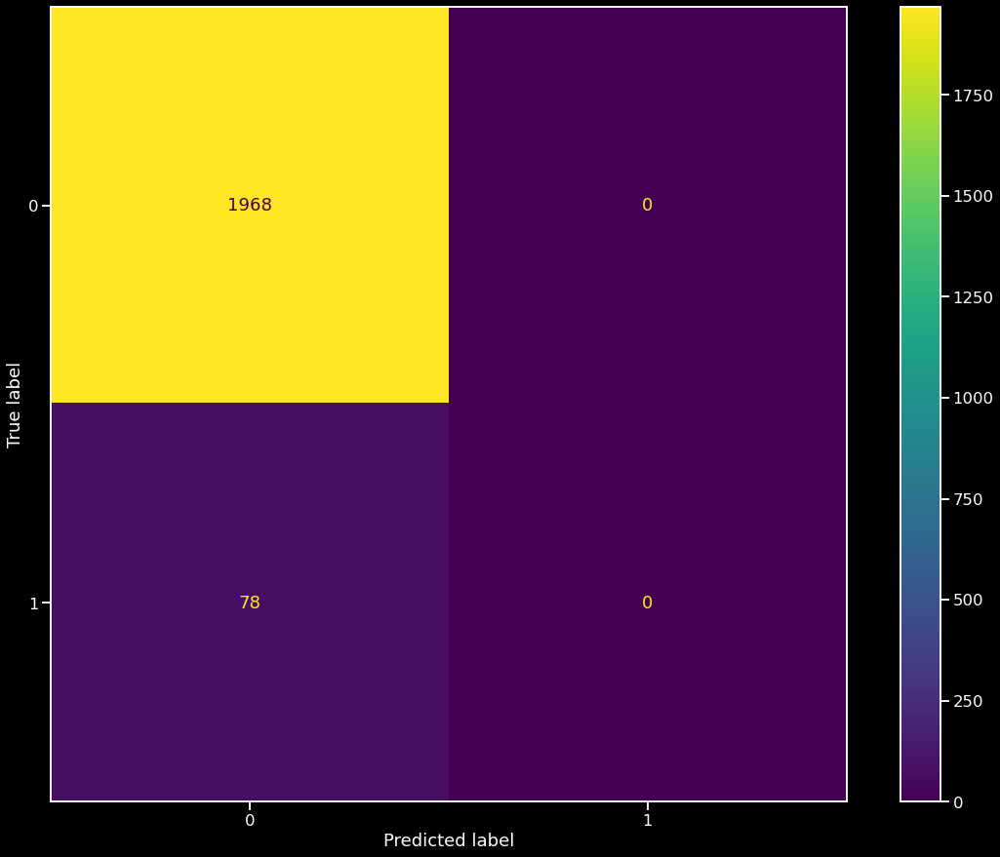

In [37]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test, dt_y_test_pred))
print(confusion_matrix(y_test, dt_y_test_pred))
plot_confusion_matrix(dt, x_test, y_test)

### Random Forest

In [38]:
# Entrenamos un modelo de random forest

from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=50, criterion='entropy', random_state = 42)
rf.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=42)

In [39]:
# Predicciones en train y test

rf_y_train_pred = rf.predict(x_train)
rf_y_test_pred = rf.predict(x_test)

In [40]:
# Chequeamos el f1 del modelo

rf_train_f1 = f1_score(y_train, rf_y_train_pred, average='weighted')

rf_test_f1 = f1_score(y_test, rf_y_test_pred, average='weighted')

print('Train F-1: ', rf_train_f1)
print('Test F-1: ', rf_test_f1)

Train F-1:  0.9993682110756321
Test F-1:  0.9521963358496703


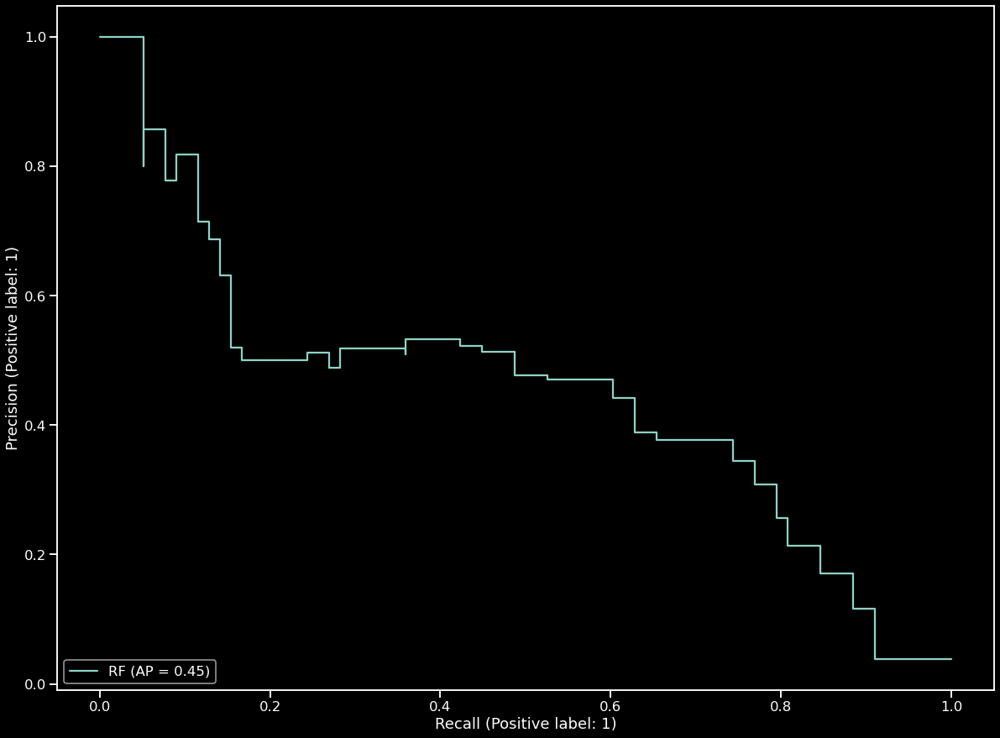

In [41]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(rf, x_test, y_test, name='RF')

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1968
           1       0.75      0.12      0.20        78

    accuracy                           0.96      2046
   macro avg       0.86      0.56      0.59      2046
weighted avg       0.96      0.96      0.95      2046

[[1965    3]
 [  69    9]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


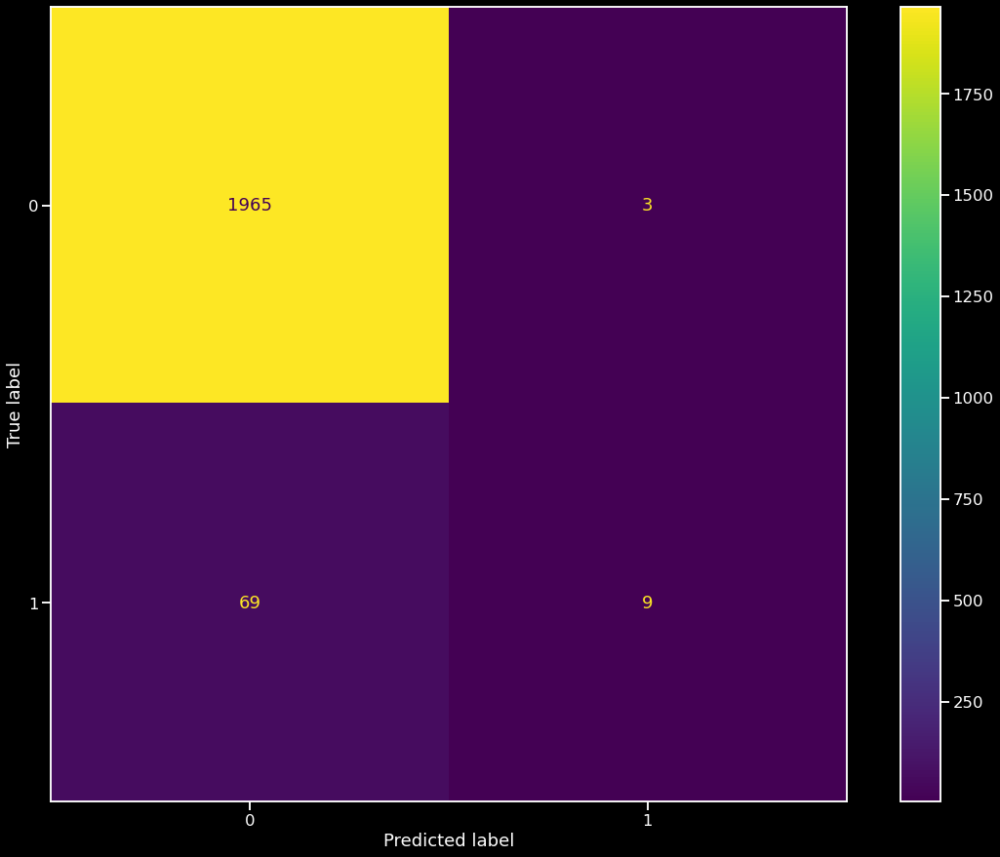

In [42]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test, rf_y_test_pred))
print(confusion_matrix(y_test, rf_y_test_pred))
plot_confusion_matrix(rf, x_test, y_test)

### Logistic Regresion

In [43]:
# Entrenamos un modelo de regresion logistica

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter = 10)
lr.fit(x_train,y_train)

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=10)

In [44]:
# Predicciones en train y test

lr_y_train_pred = lr.predict(x_train)
lr_y_test_pred = lr.predict(x_test)

In [45]:
# Chequeamos el f1 del modelo

lr_train_f1 = f1_score(y_train, lr_y_train_pred, average='weighted')

lr_test_f1 = f1_score(y_test, lr_y_test_pred, average='weighted')

print('Train F-1: ', lr_train_f1)
print('Test F-1: ', lr_test_f1)

Train F-1:  0.9665274353127811
Test F-1:  0.9546751702143823


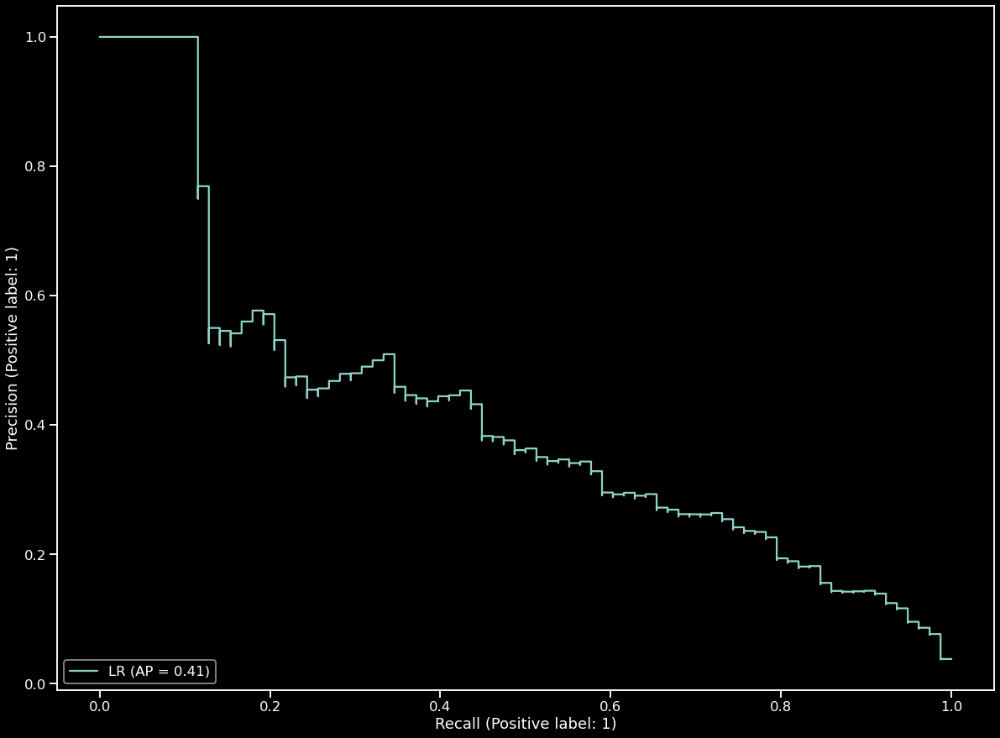

In [46]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(lr, x_test, y_test, name='LR')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1968
           1       0.56      0.19      0.29        78

    accuracy                           0.96      2046
   macro avg       0.76      0.59      0.63      2046
weighted avg       0.95      0.96      0.95      2046

[[1956   12]
 [  63   15]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


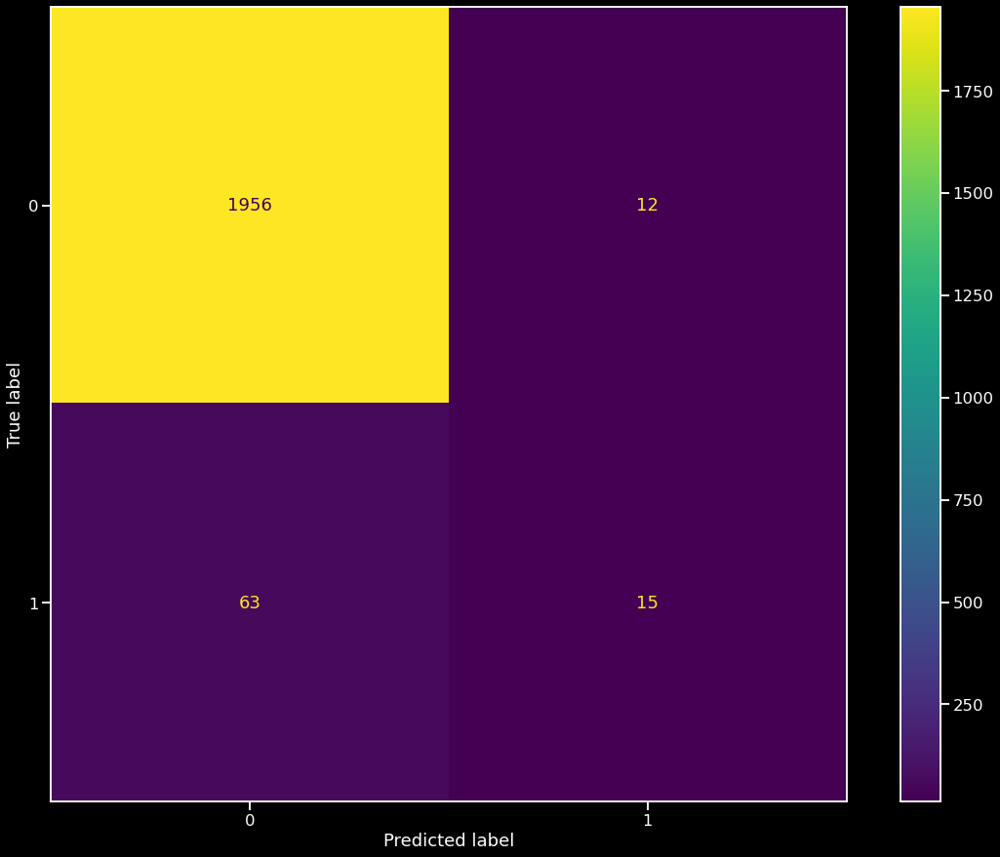

In [47]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test, lr_y_test_pred))
print(confusion_matrix(y_test, lr_y_test_pred))
plot_confusion_matrix(lr, x_test, y_test)

### K Nearest Neighbors

In [48]:
# Entrenamos un modelo de k nearest neighbors

from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [49]:
# Predicciones en train y test

knn_y_train_pred = knn.predict(x_train)
knn_y_test_pred = knn.predict(x_test)

In [50]:
# Chequeamos el f1 del modelo

knn_train_f1 = f1_score(y_train, knn_y_train_pred, average='weighted')

knn_test_f1 = f1_score(y_test, knn_y_test_pred, average='weighted')

print('Train F-1: ', knn_train_f1)
print('Test F-1: ', knn_test_f1)

Train F-1:  0.9687656843059642
Test F-1:  0.9505481121777383


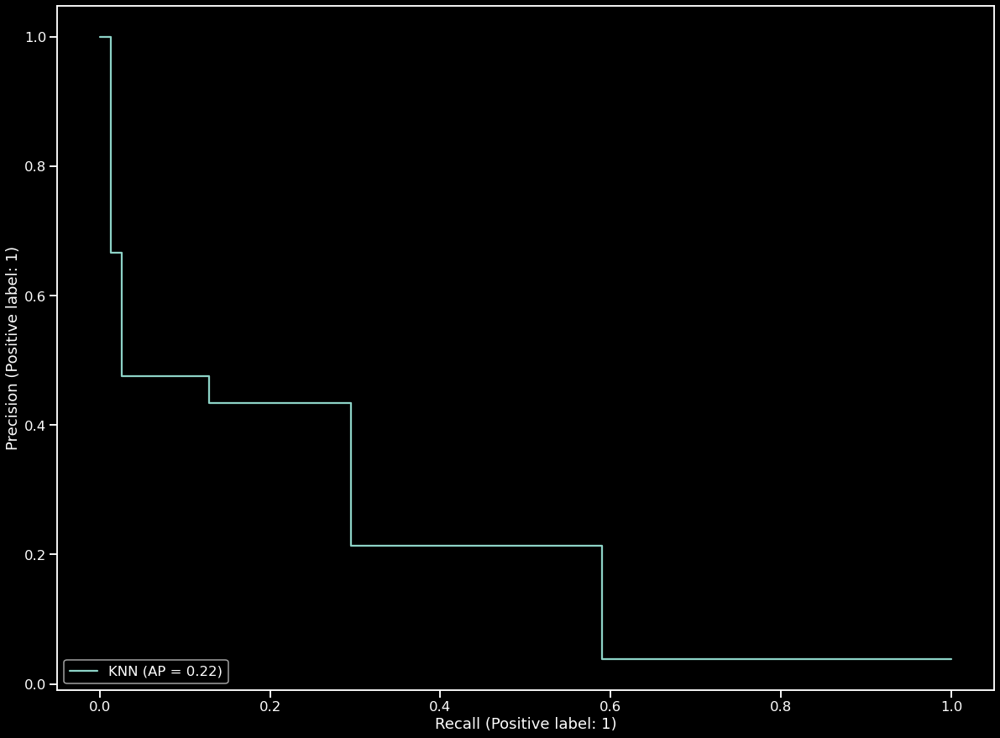

In [51]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(knn, x_test, y_test, name='KNN')

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1968
           1       0.48      0.13      0.20        78

    accuracy                           0.96      2046
   macro avg       0.72      0.56      0.59      2046
weighted avg       0.95      0.96      0.95      2046

[[1957   11]
 [  68   10]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


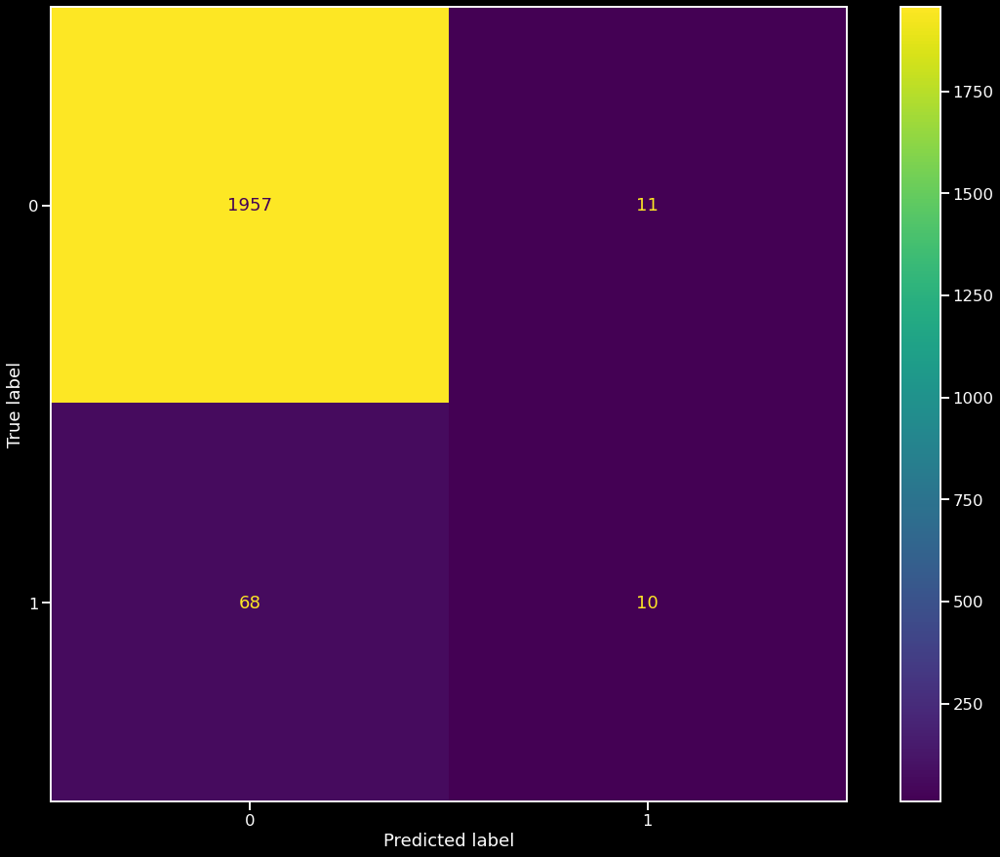

In [52]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test, knn_y_test_pred))
print(confusion_matrix(y_test, knn_y_test_pred))
plot_confusion_matrix(knn, x_test, y_test)

### SVM

In [53]:
# Entrenamos un modelo de SVM

from sklearn.svm import SVC
svc = SVC(kernel = 'rbf')
svc.fit(x_train,y_train)

SVC()

In [54]:
# Predicciones en train y test

svc_y_train_pred = svc.predict(x_train)
svc_y_test_pred = svc.predict(x_test)

In [55]:
# Chequeamos el f1 del modelo

svc_train_f1 = f1_score(y_train, svc_y_train_pred, average='weighted')

svc_test_f1 = f1_score(y_test, svc_y_test_pred, average='weighted')

print('Train F-1: ', svc_train_f1)
print('Test F-1: ', svc_test_f1)

Train F-1:  0.9670531612595705
Test F-1:  0.9429413058585989


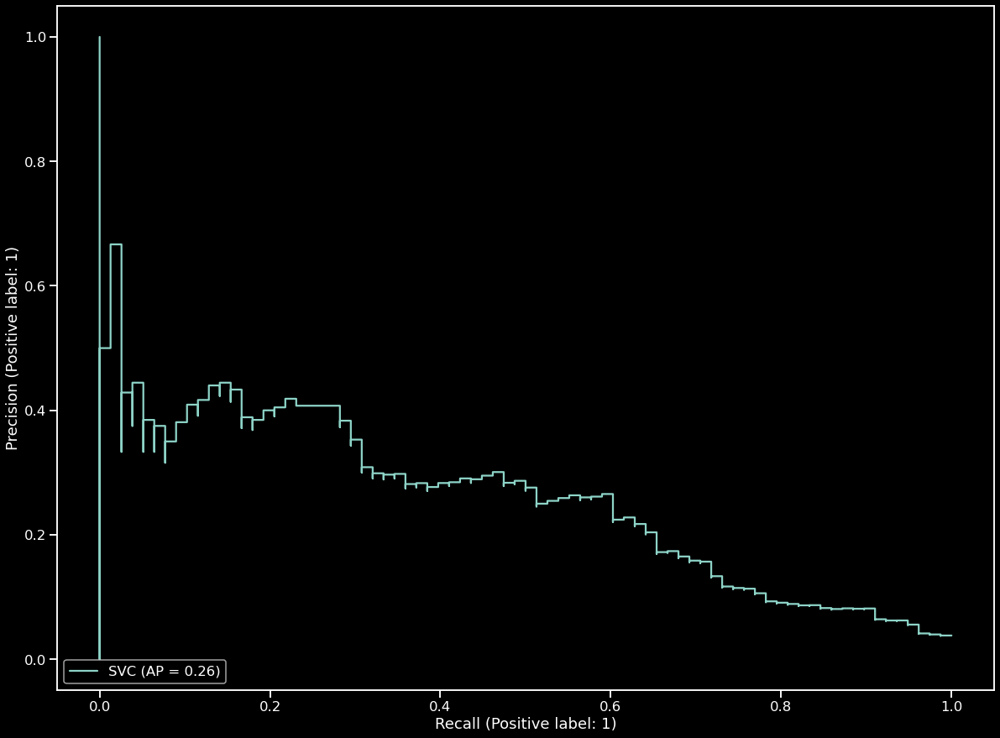

In [56]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(svc, x_test, y_test, name='SVC')

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1968
           1       0.00      0.00      0.00        78

    accuracy                           0.96      2046
   macro avg       0.48      0.50      0.49      2046
weighted avg       0.93      0.96      0.94      2046

[[1967    1]
 [  78    0]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


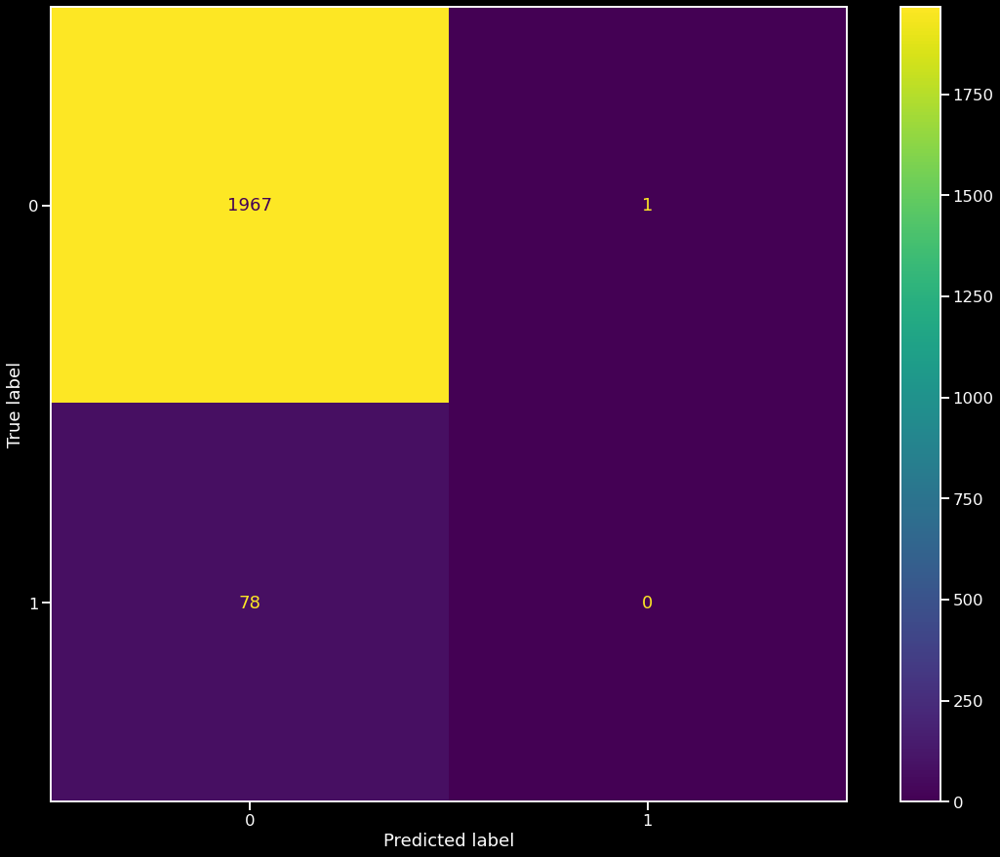

In [57]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test, svc_y_test_pred))
print(confusion_matrix(y_test, svc_y_test_pred))
plot_confusion_matrix(svc, x_test, y_test)

### Naive Bayes

In [58]:
# Entrenamos un modelo de Naive Bayes

from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(x_train,y_train)

GaussianNB()

In [59]:
# Predicciones en train y test

nb_y_train_pred = nb.predict(x_train)
nb_y_test_pred = nb.predict(x_test)

In [60]:
# Chequeamos el f1 del modelo

nb_train_f1 = f1_score(y_train, nb_y_train_pred, average='weighted')

nb_test_f1 = f1_score(y_test, nb_y_test_pred, average='weighted')

print('Train F-1: ', nb_train_f1)
print('Test F-1: ', nb_test_f1)

Train F-1:  0.3078124174266502
Test F-1:  0.2873325610131842


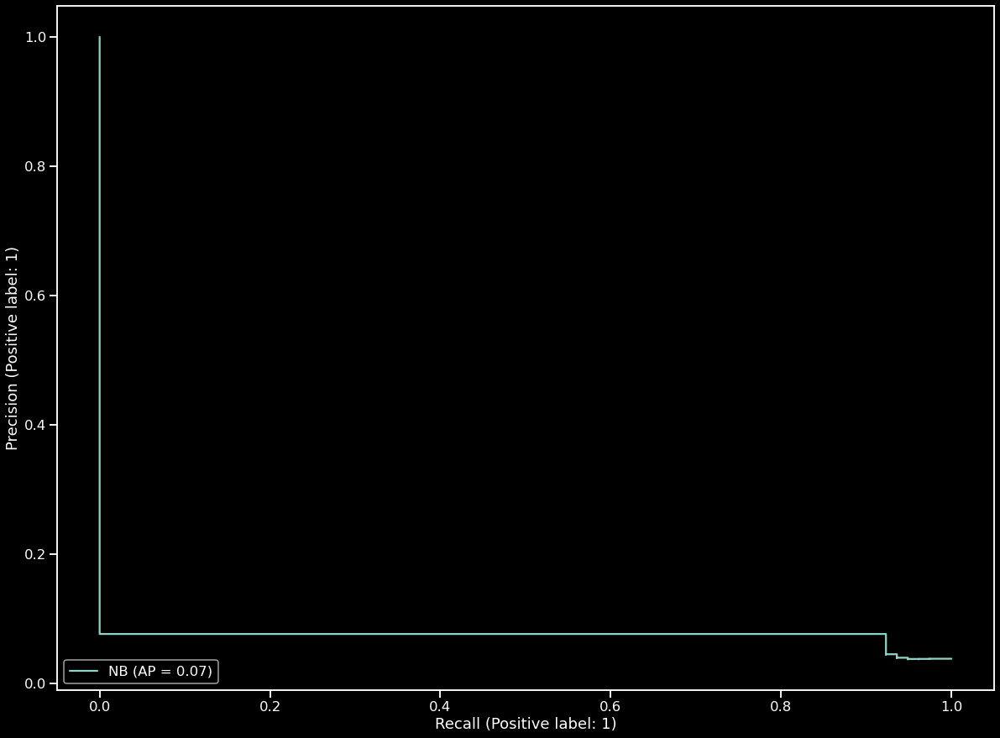

In [61]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(nb, x_test, y_test, name='NB')

              precision    recall  f1-score   support

           0       0.99      0.17      0.30      1968
           1       0.04      0.94      0.08        78

    accuracy                           0.20      2046
   macro avg       0.51      0.55      0.19      2046
weighted avg       0.95      0.20      0.29      2046

[[ 342 1626]
 [   5   73]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


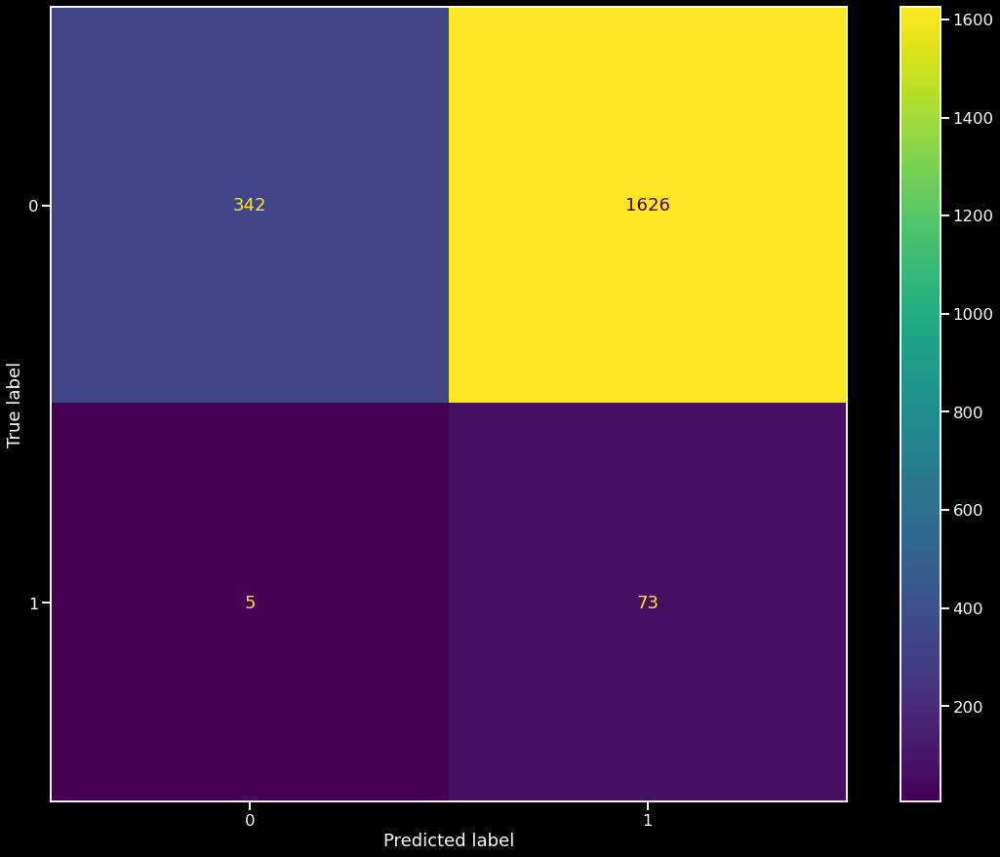

In [62]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test, nb_y_test_pred))
print(confusion_matrix(y_test, nb_y_test_pred))
plot_confusion_matrix(nb, x_test, y_test)

### Analisis de F-1 de los Modelos

Text(0.5, 1.0, 'F-1 de los Modelos en Test')

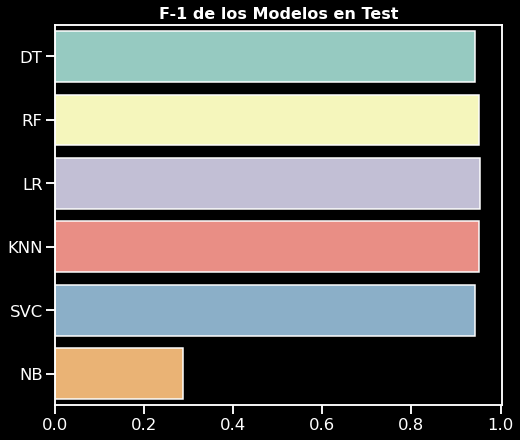

In [63]:
# Mostramos el f1 pesado para cada uno de los modelos

plt.figure(figsize= (8,7))
f1_norm = [dt_test_f1, rf_test_f1, lr_test_f1, knn_test_f1, svc_test_f1, nb_test_f1]
name = ['DT','RF','LR','KNN','SVC', 'NB']
sns.barplot(x = f1_norm, y = name)
plt.title("F-1 de los Modelos en Test", fontsize=16, fontweight="bold")

Si bien la metrica de F-1 pesado para los modelos, en general (salvo para el modelo de Naive Bayes) es buena, al revisar en detalle el reporte de metricas y la matriz de confusion para cada uno de los modelos, podemos observar que los mismos no logran adecuadamente el objetivo planteado.

Recordemos que el objetivo planteado para el dataset es lograr predecir que sociedades se pueden encontrar en un estado de cesasion de pagos. Dicho esto, al observar el recall para la clase 1 (correspondiente a sociedades en quiebra), la misma es extremadamente baja (excepto para Naive Bayes, donde la situacion es inversa). Asimismo, al revisar las matrices de confusion, existen casos en los que los modelos no fueron capaces de predecir al menos un caso de quiebra (ver por ejemplo el caso del arbol de decison, donde se predijo todo como 0). Por ultimo, vemos que el area bajo la curva al graficar la curva de precision-recall es siempre pequena. Esto muestra a las claras que el modelo se encuentra sesgado hacia la clase mayoritaria (0 - sociedades que no quebraron).

Deberemos entonces trabajar con respecto al desbalance del dataset, a efectos de mejorar el recall (y por consiguiente el F-1) para la clase minoritaria.

## Haciendonos Cargo del Desbalance

In [64]:
# Importamos el metodo SMOTE
# (Synthetic Minority Over-Sampling Technique)

from imblearn.over_sampling import SMOTE

In [65]:
# Entrenamos el modelo

smote = SMOTE(sampling_strategy='minority')
x_smote, y_smote = smote.fit_resample(x, y)

In [66]:
# Hacemos un counter para ver como quedaron distribuidas las clases

from collections import Counter
print('Resampled dataset shape %s' % Counter(y_smote))

Resampled dataset shape Counter({1: 6599, 0: 6599})


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='target', ylabel='count'>

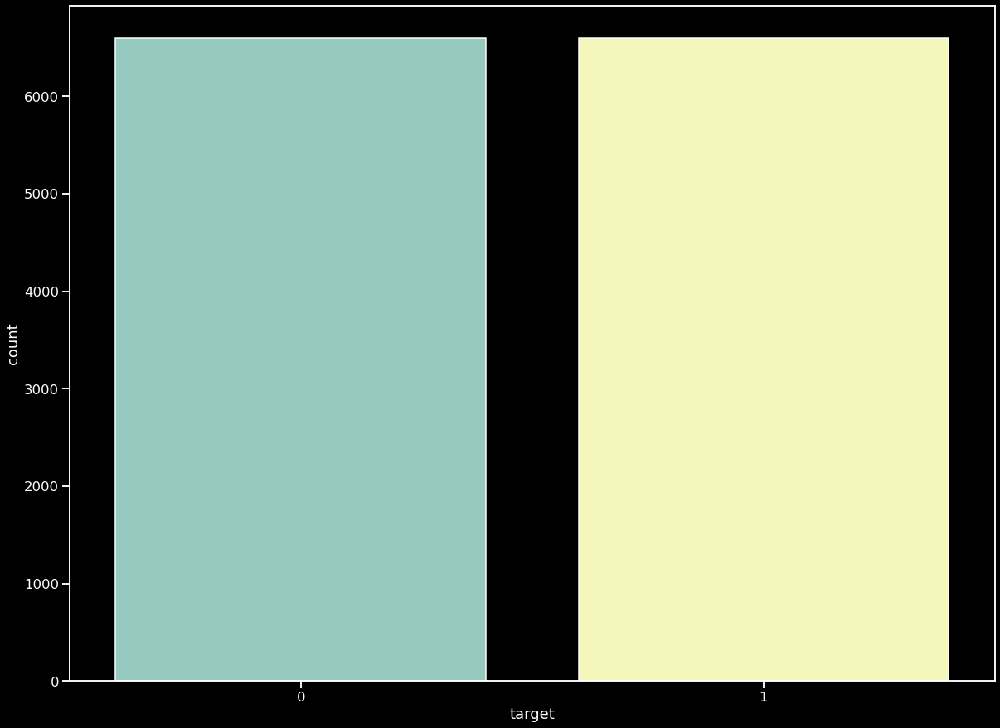

In [67]:
# Hacemos un grafico para mostrar la paridad en la nueva distribucion

y_res = pd.DataFrame(data=y_smote)
sns.countplot('target', data=y_res)

In [68]:
# Separameos los datos en training y testing en un 70% y 30%
x_train_smote, x_test_smote, y_train_smote, y_test_smote = train_test_split(x_smote, y_smote, test_size = 0.30, random_state = 42)

In [69]:
# Pasamos los datos por el standard scaler

scaler = StandardScaler()
scaler.fit(x_train_smote)
x_train_smote = pd.DataFrame(scaler.transform(x_train_smote), index=x_train_smote.index, columns=x_train_smote.columns)
x_test_smote = pd.DataFrame(scaler.transform(x_test_smote), index=x_test_smote.index, columns=x_test_smote.columns)

La tecnica de SMOTE es una tecnica para el over-sampling (amplicacion de registros) de la clase minoritaria. Hemos elegido esta tecnica por dos razones. Primero, la hemos preferido al under-sampling (que implicaria reducir la cantidad de muestras la clase mayoritaria), dada la poca cantidad de muestras que existen en la clase minoritaria. Asi se evita perder datos que pueden resultar valiosos. En segunda intancia, esta tecnica busca producir instancias de forma sintetica (artifical, a traves de la observacion de vecinos cercanos) a partir del data set original. Esto evita el overfitting, que podria ocurrir en caso de utilizar otro metodo de over-sampling donde solo se agregan replicas de la clase minoritaria.

Observamos que el dataset quedo mas balanceado, por lo que procederemos a re-entrenar los modelos a partir de esrte dataset.

## Modelos

### Arbol de Decision

In [70]:
# Entrenamos un modelo de arbol de desicion

dt_smote = DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)
dt_smote.fit(x_train_smote,y_train_smote)

DecisionTreeClassifier(criterion='entropy', max_depth=2, random_state=42)

In [71]:
# Predicciones en train y test

dt_y_train_smote_pred = dt_smote.predict(x_train_smote)
dt_y_test_smote_pred = dt_smote.predict(x_test_smote)

In [72]:
# Chequeamos el f1 del modelo

dt_train_smote_f1 = f1_score(y_train_smote, dt_y_train_smote_pred, average='weighted')

dt_test_smote_f1 = f1_score(y_test_smote, dt_y_test_smote_pred, average='weighted')

print('Train F-1: ', dt_train_smote_f1)
print('Test F-1: ', dt_test_smote_f1)

Train F-1:  0.8501827936626591
Test F-1:  0.8507706628628992


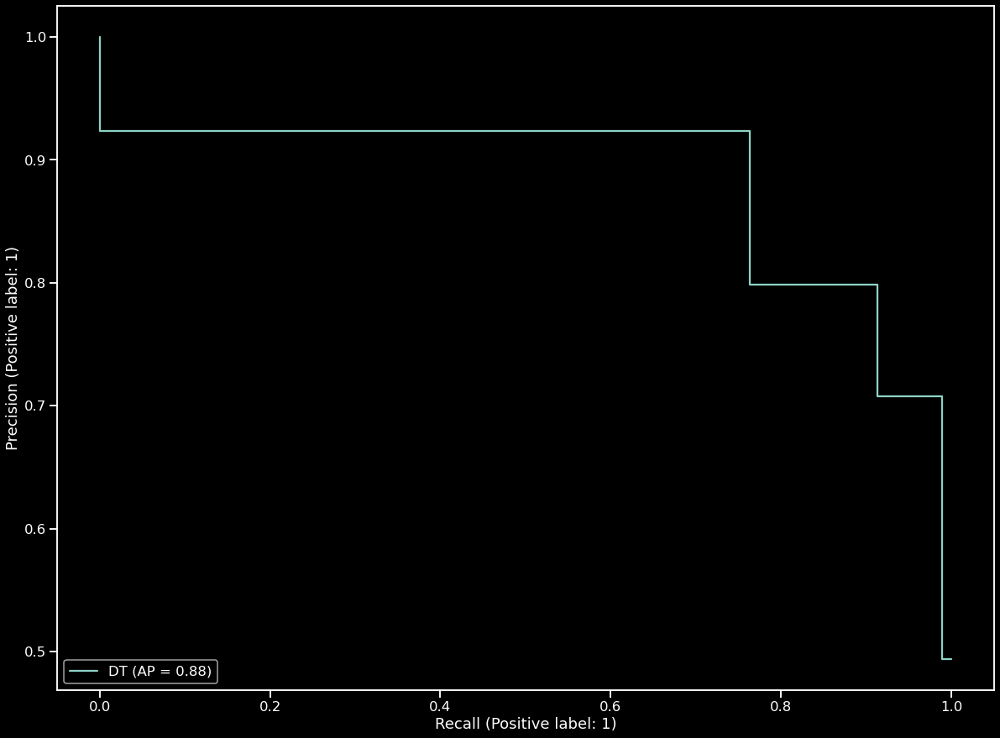

In [73]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(dt_smote, x_test_smote, y_test_smote, name='DT')

              precision    recall  f1-score   support

           0       0.80      0.94      0.87      2005
           1       0.92      0.76      0.84      1955

    accuracy                           0.85      3960
   macro avg       0.86      0.85      0.85      3960
weighted avg       0.86      0.85      0.85      3960

[[1881  124]
 [ 462 1493]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


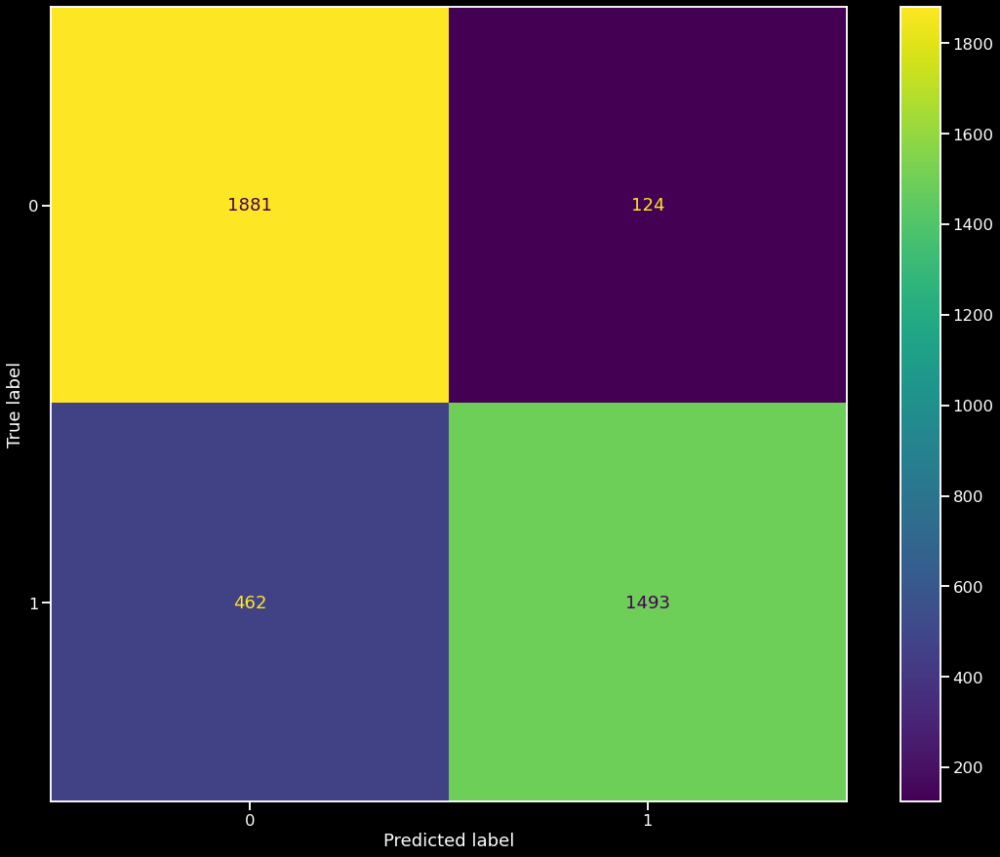

In [74]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test_smote, dt_y_test_smote_pred))
print(confusion_matrix(y_test_smote, dt_y_test_smote_pred))
plot_confusion_matrix(dt_smote, x_test_smote, y_test_smote)

### Random Forest

In [75]:
# Entrenamos un modelo de random forest

rf_smote = RandomForestClassifier(n_estimators=50, criterion='entropy', random_state = 42)
rf_smote.fit(x_train_smote,y_train_smote)

RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=42)

In [76]:
# Predicciones en train y test

rf_y_train_smote_pred = rf_smote.predict(x_train_smote)
rf_y_test_smote_pred = rf_smote.predict(x_test_smote)

In [77]:
# Chequeamos el f1 del modelo

rf_train_smote_f1 = f1_score(y_train_smote, rf_y_train_smote_pred, average='weighted')

rf_test_smote_f1 = f1_score(y_test_smote, rf_y_test_smote_pred, average='weighted')

print('Train F-1: ', rf_train_smote_f1)
print('Test F-1: ', rf_test_smote_f1)

Train F-1:  1.0
Test F-1:  0.9744912231402044


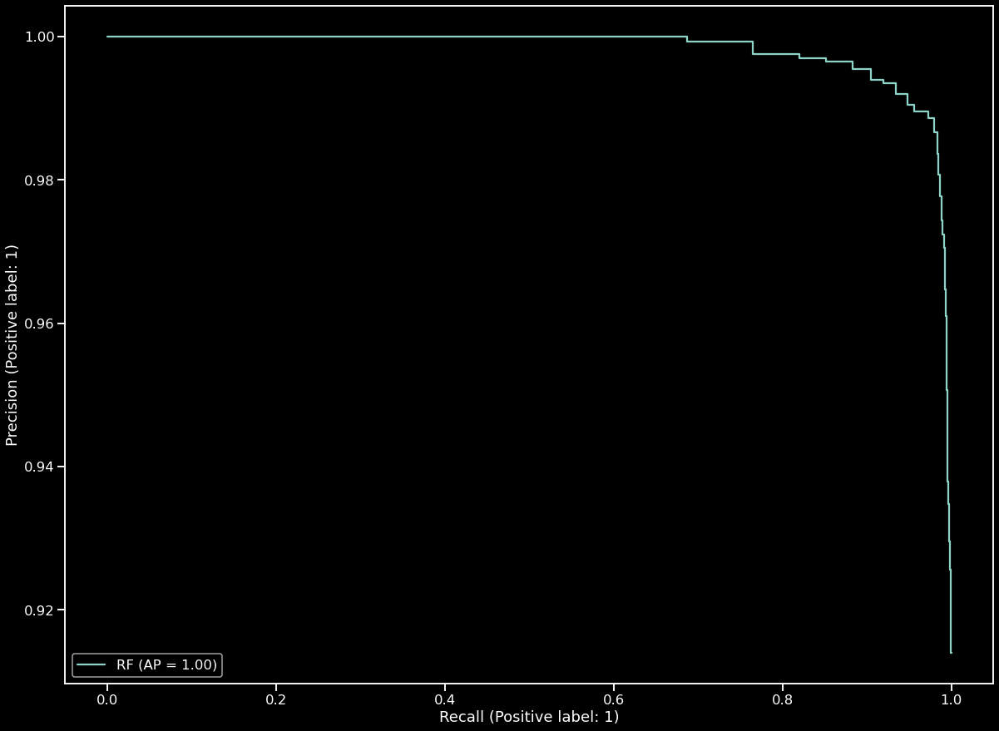

In [78]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(rf_smote, x_test_smote, y_test_smote, name='RF')

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      2005
           1       0.96      0.99      0.97      1955

    accuracy                           0.97      3960
   macro avg       0.98      0.97      0.97      3960
weighted avg       0.98      0.97      0.97      3960

[[1915   90]
 [  11 1944]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


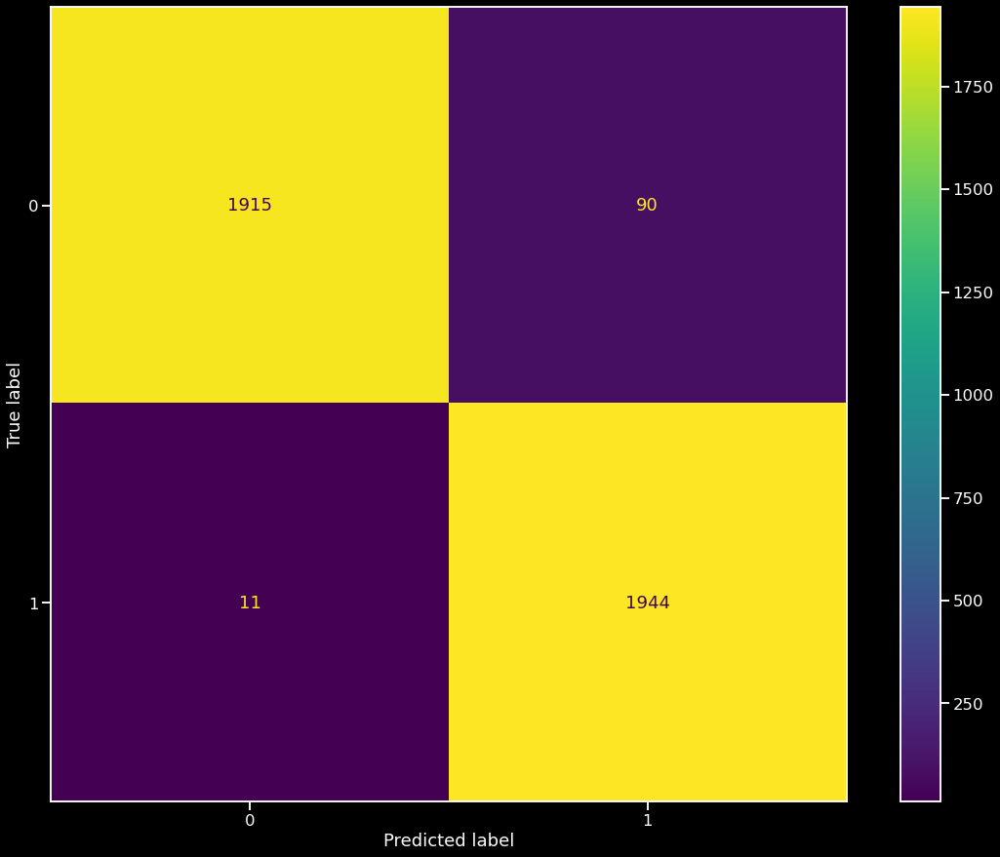

In [79]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test_smote, rf_y_test_smote_pred))
print(confusion_matrix(y_test_smote, rf_y_test_smote_pred))
plot_confusion_matrix(rf_smote, x_test_smote, y_test_smote)

### Logistic Regresion

In [80]:
# Entrenamos un modelo de regresion logistica

lr_smote = LogisticRegression(max_iter = 10)
lr_smote.fit(x_train_smote,y_train_smote)

/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=10)

In [81]:
# Predicciones en train y test

lr_y_train_smote_pred = lr_smote.predict(x_train_smote)
lr_y_test_smote_pred = lr_smote.predict(x_test_smote)

In [82]:
# Chequeamos el f1 del modelo

lr_train_smote_f1 = f1_score(y_train_smote, lr_y_train_smote_pred, average='weighted')

lr_test_smote_f1 = f1_score(y_test_smote, lr_y_test_smote_pred, average='weighted')

print('Train F-1: ', lr_train_smote_f1)
print('Test F-1: ', lr_test_smote_f1)

Train F-1:  0.9017890896041741
Test F-1:  0.901255454549197


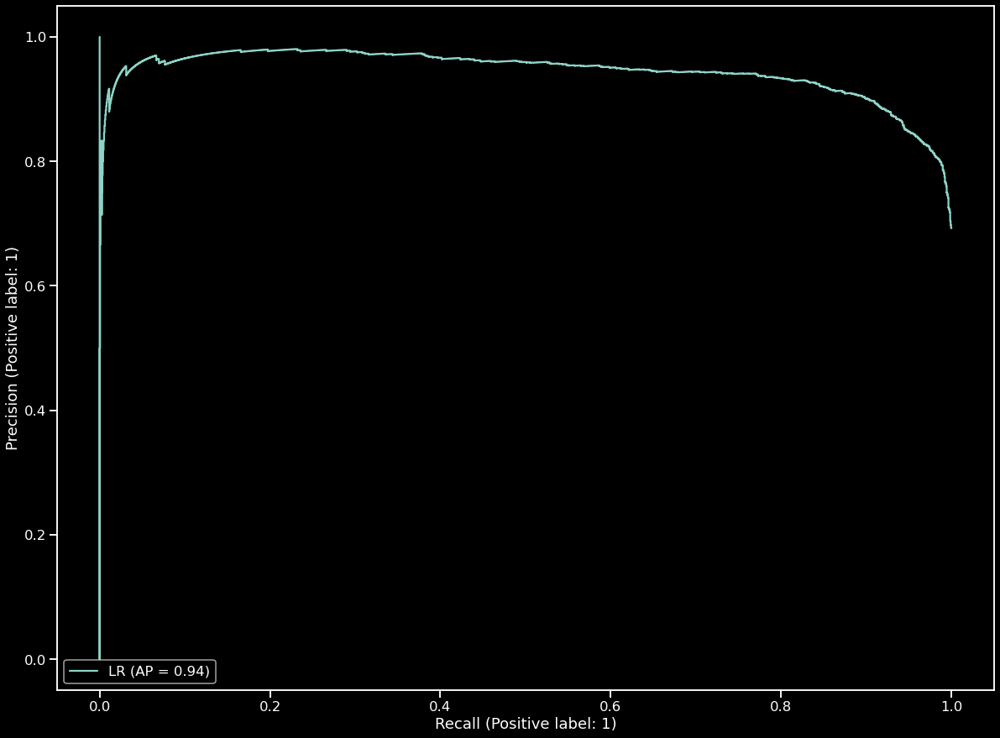

In [83]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(lr_smote, x_test_smote, y_test_smote, name='LR')

              precision    recall  f1-score   support

           0       0.92      0.89      0.90      2005
           1       0.89      0.92      0.90      1955

    accuracy                           0.90      3960
   macro avg       0.90      0.90      0.90      3960
weighted avg       0.90      0.90      0.90      3960

[[1776  229]
 [ 162 1793]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


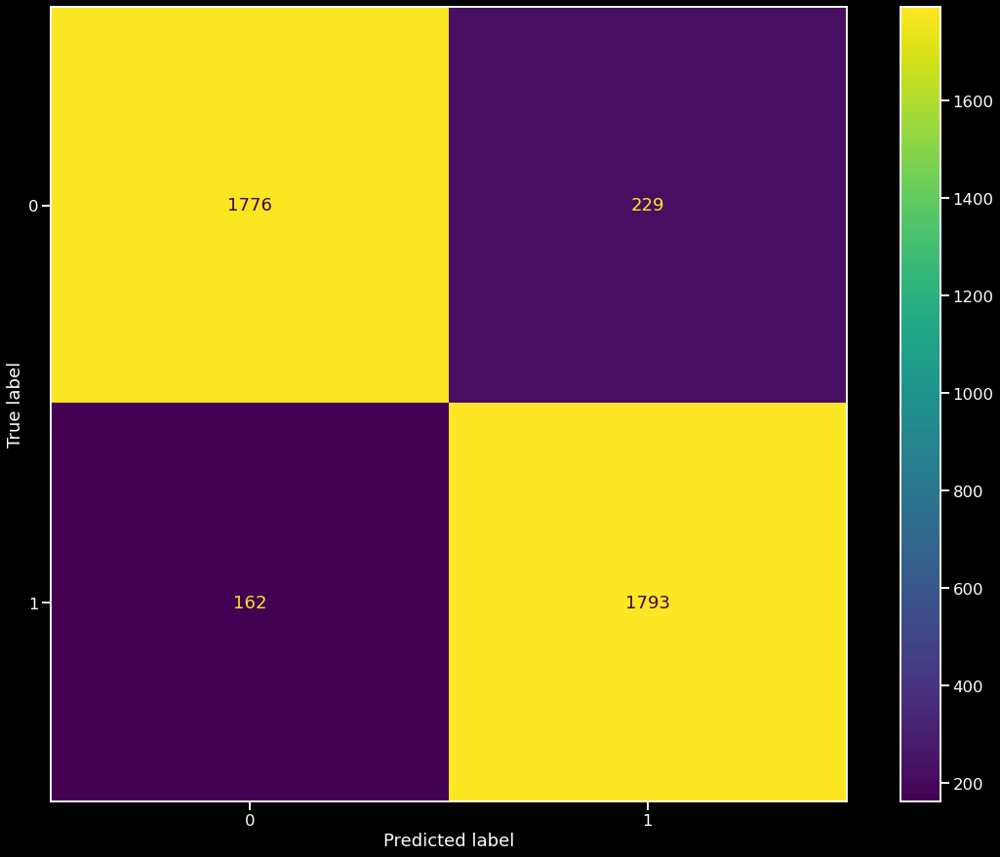

In [84]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test_smote, lr_y_test_smote_pred))
print(confusion_matrix(y_test_smote, lr_y_test_smote_pred))
plot_confusion_matrix(lr_smote, x_test_smote, y_test_smote)

### K Nearest Neighbors

In [85]:
# Entrenamos un modelo de k nearest neighbors

knn_smote = KNeighborsClassifier()
knn_smote.fit(x_train_smote,y_train_smote)

KNeighborsClassifier()

In [86]:
# Predicciones en train y test

knn_y_train_smote_pred = knn_smote.predict(x_train_smote)
knn_y_test_smote_pred = knn_smote.predict(x_test_smote)

In [87]:
# Chequeamos el f1 del modelo

knn_train_smote_f1 = f1_score(y_train_smote, knn_y_train_smote_pred, average='weighted')

knn_test_smote_f1 = f1_score(y_test_smote, knn_y_test_smote_pred, average='weighted')

print('Train F-1: ', knn_train_smote_f1)
print('Test F-1: ', knn_test_smote_f1)

Train F-1:  0.9555197728253525
Test F-1:  0.9410012894711622


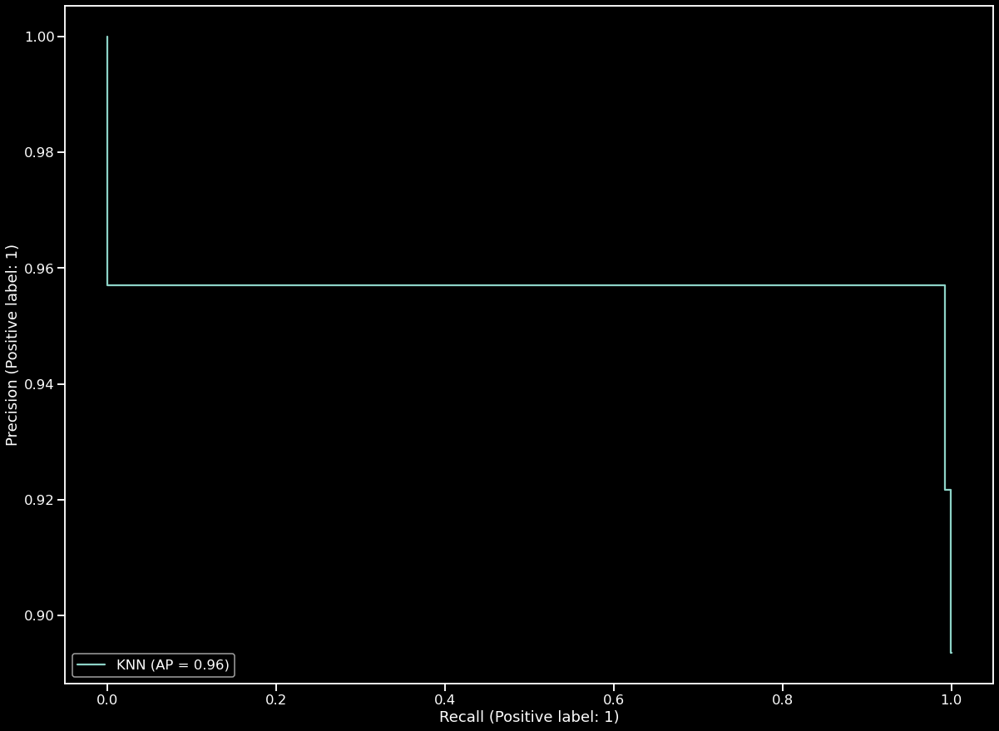

In [88]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(knn_smote, x_test_smote, y_test_smote, name='KNN')

              precision    recall  f1-score   support

           0       1.00      0.88      0.94      2005
           1       0.89      1.00      0.94      1955

    accuracy                           0.94      3960
   macro avg       0.95      0.94      0.94      3960
weighted avg       0.95      0.94      0.94      3960

[[1772  233]
 [   0 1955]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


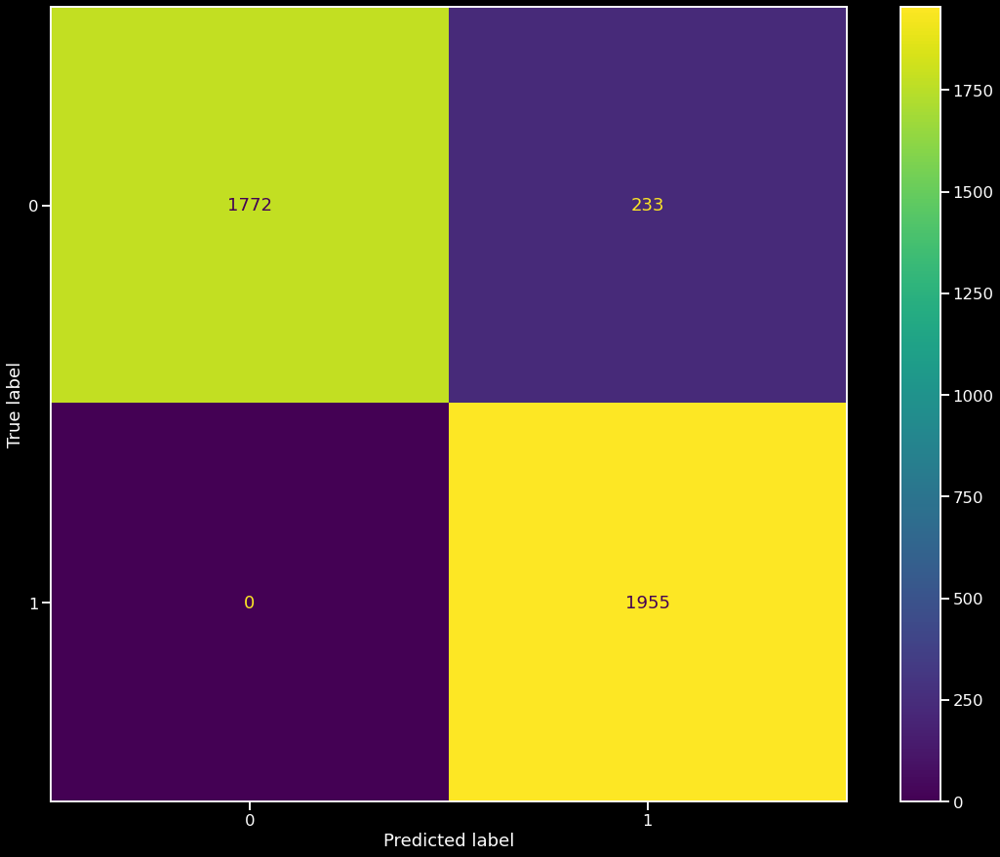

In [89]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test_smote, knn_y_test_smote_pred))
print(confusion_matrix(y_test_smote, knn_y_test_smote_pred))
plot_confusion_matrix(knn_smote, x_test_smote, y_test_smote)

### SVM

In [90]:
# Entrenamos un modelo de SVM

svc_smote = SVC(kernel = 'rbf')
svc_smote.fit(x_train_smote,y_train_smote)

SVC()

In [91]:
# Predicciones en train y test

svc_y_train_smote_pred = svc_smote.predict(x_train_smote)
svc_y_test_smote_pred = svc_smote.predict(x_test_smote)

In [92]:
# Chequeamos el f1 del modelo

svc_train_smote_f1 = f1_score(y_train_smote, svc_y_train_smote_pred, average='weighted')

svc_test_smote_f1 = f1_score(y_test_smote, svc_y_test_smote_pred, average='weighted')

print('Train F-1: ', svc_train_smote_f1)
print('Test F-1: ', svc_test_smote_f1)

Train F-1:  0.9547024068983814
Test F-1:  0.9542594677586503


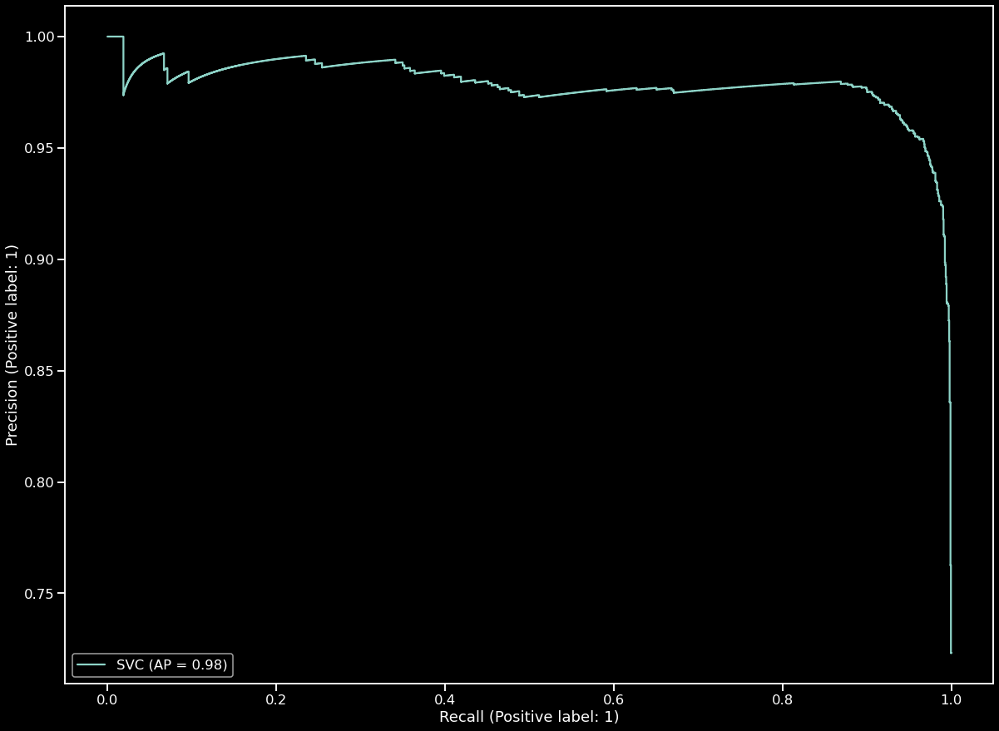

In [93]:
# Mostramos la curva precision-recall
display = PrecisionRecallDisplay.from_estimator(svc_smote, x_test_smote, y_test_smote, name='SVC')

              precision    recall  f1-score   support

           0       0.99      0.92      0.95      2005
           1       0.92      0.99      0.96      1955

    accuracy                           0.95      3960
   macro avg       0.96      0.95      0.95      3960
weighted avg       0.96      0.95      0.95      3960

[[1847  158]
 [  23 1932]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


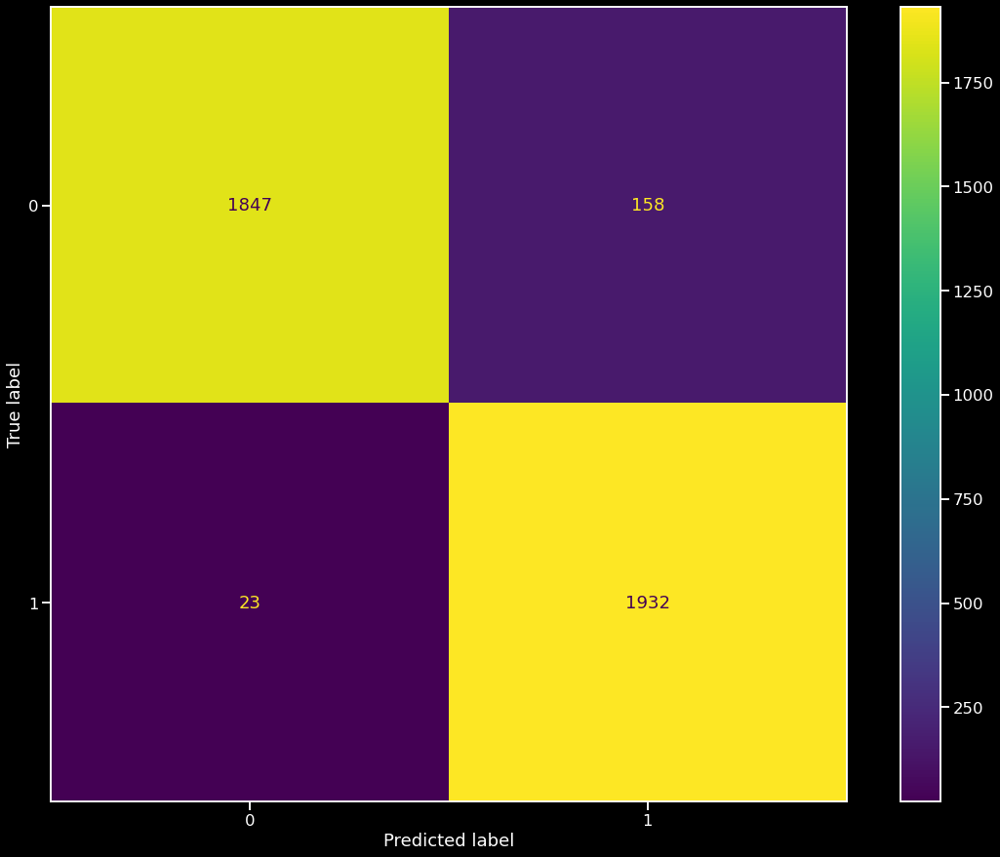

In [94]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test_smote, svc_y_test_smote_pred))
print(confusion_matrix(y_test_smote, svc_y_test_smote_pred))
plot_confusion_matrix(svc_smote, x_test_smote, y_test_smote)

### Naive Bayes

In [95]:
# Entrenamos un modelo de Naive Bayes

nb_smote = GaussianNB()
nb_smote.fit(x_train_smote,y_train_smote)

GaussianNB()

In [96]:
# Predicciones en train y test

nb_y_train_smote_pred = nb_smote.predict(x_train_smote)
nb_y_test_smote_pred = nb_smote.predict(x_test_smote)

In [97]:
# Chequeamos el f1 del modelo

nb_train_smote_f1 = f1_score(y_train_smote, nb_y_train_smote_pred, average='weighted')

nb_test_smote_f1 = f1_score(y_test_smote, nb_y_test_smote_pred, average='weighted')

print('Train F-1: ', nb_train_smote_f1)
print('Test F-1: ', nb_test_smote_f1)

Train F-1:  0.739284639790957
Test F-1:  0.7262107203310957


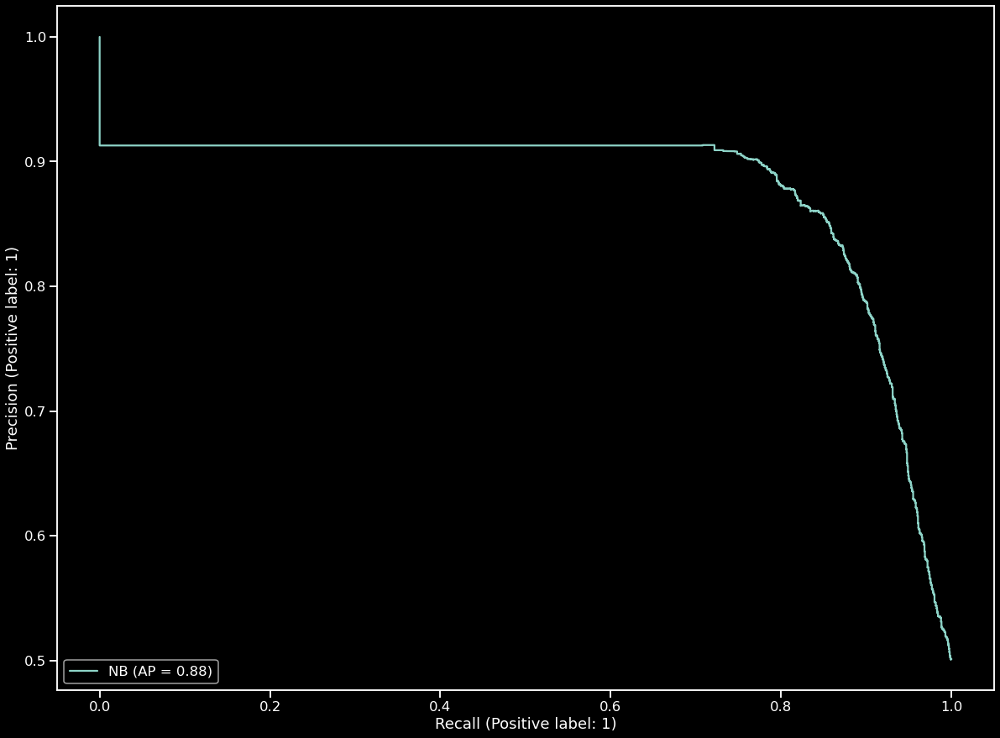

In [98]:
# Mostramos la curva precision-recall

display = PrecisionRecallDisplay.from_estimator(nb_smote, x_test_smote, y_test_smote, name='NB')

              precision    recall  f1-score   support

           0       0.91      0.53      0.67      2005
           1       0.66      0.95      0.78      1955

    accuracy                           0.74      3960
   macro avg       0.79      0.74      0.73      3960
weighted avg       0.79      0.74      0.73      3960

[[1068  937]
 [ 102 1853]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


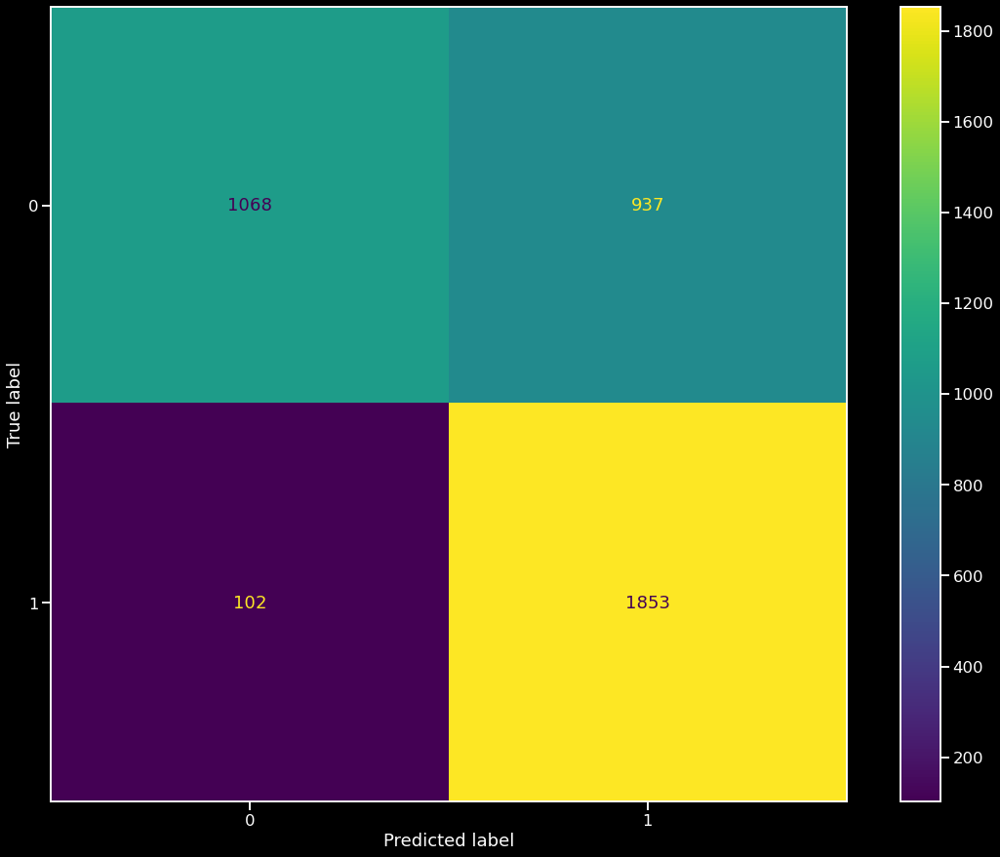

In [99]:
# Obtenemos el reporte de metricas y matriz de confusion para el modelo

print(classification_report(y_test_smote, nb_y_test_smote_pred))
print(confusion_matrix(y_test_smote, nb_y_test_smote_pred))
plot_confusion_matrix(nb_smote, x_test_smote, y_test_smote)

## Analisis de F-1 de los Modelos

Text(0.5, 1.0, 'F-1 de los Modelos en Test')

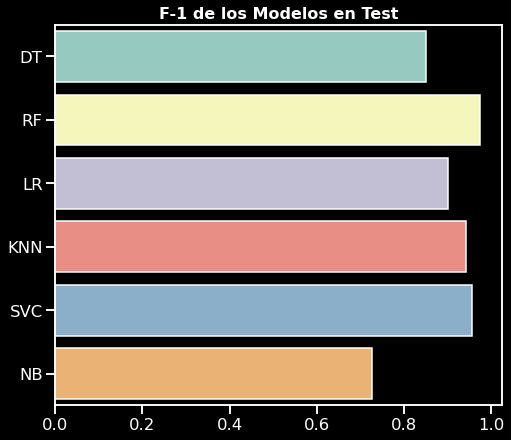

In [100]:
# Mostramos el f1 pesado para cada uno de los modelos

plt.figure(figsize= (8,7))
f1_smote = [dt_test_smote_f1, rf_test_smote_f1, lr_test_smote_f1, knn_test_smote_f1, svc_test_smote_f1, nb_test_smote_f1]
name = ['DT','RF','LR','KNN','SVC', 'NB']
sns.barplot(x = f1_smote, y = name)
plt.title("F-1 de los Modelos en Test", fontsize=16, fontweight="bold")

Podemos ver como, a pesar de que el F-1 pesado para los modelos es sensiblemente menor que en el caso anterior (previo a aplicar la tecnica de SMOTE), el recall para la clase minoritaria aumento de forma drastica, sin que se haya impactado de manera considerable la precision con respecto a la clase mayoritaria. Se mantienen buenas metricas de precision, recall y F-1 pesado para cada uno de los modelos y el area bajo la curva de precision-recall aumento considerablemente.

Son de destacar especialmente las metricas obtenidas por el modelo de SVM, que se repiten a continuacion.
* El recall y la precision para cada una de las clases se encuentran por encima del 90%.
* El F-1 pesado es del 95%.
* El recall para la clase 1 es del 98% con una precision del 92%.
* El modelo acerto en 1920 de 1955 donde la compania se encontraba en estado de quiebra.
* El modelo solo se equivoco en 157 casos donde los clasifico como en estado de quiebra cuando en realidad no lo estaban.

              precision    recall  f1-score   support

           0       0.99      0.92      0.95      2005
           1       0.92      0.99      0.96      1955

    accuracy                           0.95      3960
   macro avg       0.96      0.95      0.95      3960
weighted avg       0.96      0.95      0.95      3960

[[1847  158]
 [  23 1932]]


/home/jvegasainz/anaconda3/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


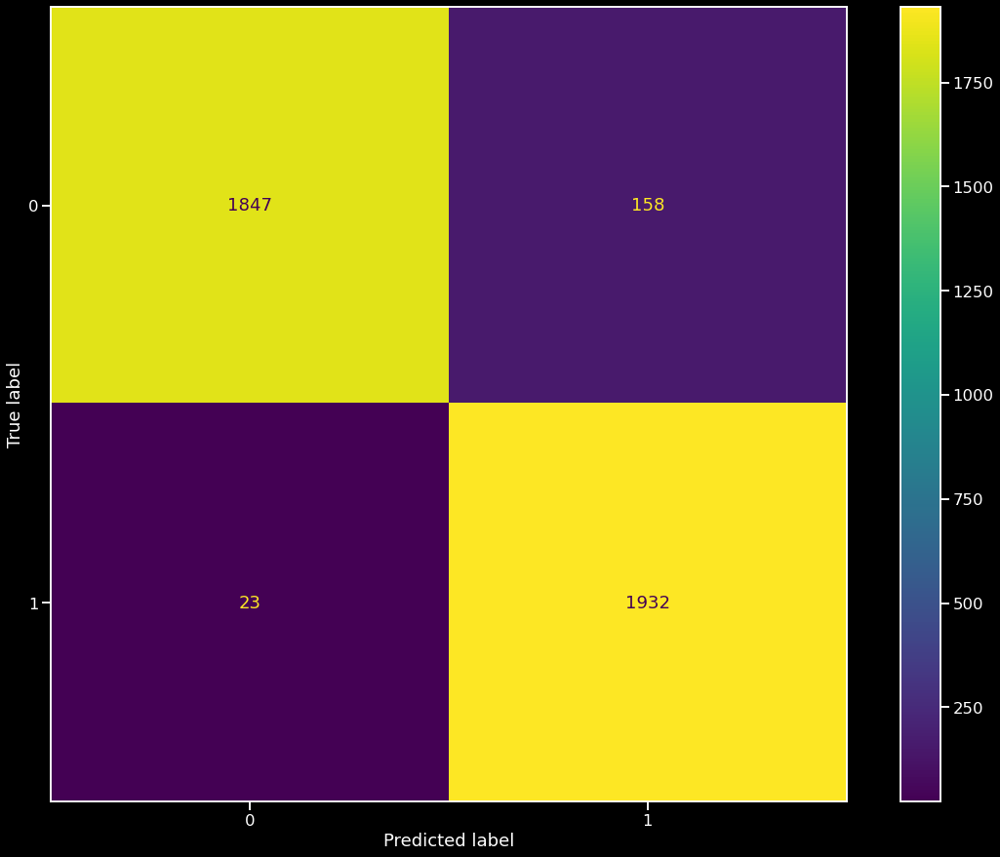

In [101]:
print(classification_report(y_test_smote, svc_y_test_smote_pred))
print(confusion_matrix(y_test_smote, svc_y_test_smote_pred))
plot_confusion_matrix(svc_smote, x_test_smote, y_test_smote)